In [657]:
import numpy as np
import matplotlib.pyplot as plt
from netCDF4 import Dataset
from scipy import interpolate
from datetime import datetime, timedelta
import cmocean
from matplotlib.dates import DateFormatter
import matplotlib.dates as mdates
myFmt = mdates.DateFormatter('%m-%d')
import glob
import pandas as pd
import xarray as xr
from sklearn.neighbors import LocalOutlierFactor
from ICECAPS_support_functions import *

## load in fancy model
from sklearn import preprocessing 
import statsmodels.api as sm
import warnings; warnings.simplefilter('ignore')

# load in other fancy model
from sklearn.linear_model import Ridge
from sklearn.datasets import make_regression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
import csv

In [655]:
# turn into function later
asfs_filepath = '/psd3data/arctic/raven_process/asfs/2_level_product/'
asfs_lev2_files = glob.glob(asfs_filepath+'seb.level2.0.melt-sleighsfs.10min.*.nc')

# asfs_filepath = '/psd3data/arctic/raven_process/asfs/2_level_product/full_period/'
# asfs_lev2_files = glob.glob(asfs_filepath+'sleighsfsseb.sleighsfs.level2.0.10min.*.nc')
asfs_lev2_files.sort()
# asfs_lev2_files = asfs_lev2_files[12:] # early files don't have skin_temp_surface?

# vaisala_T_Avg = average of the air temperature during the 1 min averaging interval

lev1_slow_vars = ['up_short_hemisp_qc','up_long_hemisp_qc','down_short_hemisp_qc','down_long_hemisp_qc','subsurface_heat_flux_A_qc',
                  'subsurface_heat_flux_B_qc','skin_temp_surface_qc','temp_qc','snow_depth_qc','zenith_true_qc',
                  'down_short_diffuse','down_short_direct','up_short_hemisp','up_long_hemisp','down_short_hemisp','down_long_hemisp',
                  'snow_depth','temp','brightness_temp_surface','skin_temp_surface','subsurface_heat_flux_A','subsurface_heat_flux_B',
                  'subsurface_heat_flux_C','zenith_true','snow_gpr_dist','base_time','time']

asfs_data_lev2 = {}

for fname in asfs_lev2_files[:]:
    print(fname)

    fdic = load_netcdf(fname, lev1_slow_vars)
    # print(fdic['time_unit'])
    fstart_time = datetime.strptime(fdic['time_unit'], 'seconds since %Y-%m-%dT%H:%M:%S.000000')
    fdic['dates'] = np.asarray([fstart_time+timedelta(seconds=int(m)) for m in fdic['time']])

    for var in lev1_slow_vars[:-2]+['dates']:
        if var not in asfs_data_lev2:
            asfs_data_lev2[var] = fdic[var]
        else:
            asfs_data_lev2[var] = np.ma.concatenate( (asfs_data_lev2[var], fdic[var]), axis=0 )
asfs_data_lev2['net_short_hemisp'] = asfs_data_lev2['down_short_hemisp'] - asfs_data_lev2['up_short_hemisp']
asfs_data_lev2['albedo'] =  asfs_data_lev2['up_short_hemisp']/asfs_data_lev2['down_short_hemisp']

with np.load('/home/asledd/ICECAPS/Raven_SW-correct-tskin_emis985_all-times_20250113.npz') as npz:
    asfs_data_lev2['skin_temp'] = np.ma.MaskedArray(**npz)

/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240520.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240521.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240522.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240523.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240524.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240525.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240526.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240527.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb.level2.0.melt-sleighsfs.10min.20240528.000000.nc
/psd3data/arctic/raven_process/asfs/2_level_product/seb

In [4]:
simba_filepath = '/psd3data/arctic/sledd/Raven_simba/'
## new adjusted temps (no smoothing)
# simba_fname = 'firnprofile-combined-corrected.sled.level2.beta.15min.20240517-20240814.nc'
# simba_fname = 'firnprofile-combined-corrected.sled.level2.beta.15min.20240517-20240814_created_Apr8_2025.nc'
# simba_fname = 'firnprofile-combined-corrected-maxheight.sled.level2.beta.15min.20240517-20240814_created_Apr8_2025.nc'
# simba_fname = 'firnprofile-combined-corrected-maxheight.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc'
simba_fname = 'firnprofile-combined-corrected-at38.sled.level2.beta.15min.20240517-20240821_created_June26_2025.nc'

season_data = {}
varnames = ['temperature','initial_height','time']
fdic = load_netcdf(simba_filepath+simba_fname, varnames)

fstart_time = datetime.strptime(fdic['time_unit'], 'minutes since %Y-%m-%d')

fdic['dates'] = np.asarray([fstart_time+timedelta(minutes=int(m)) for m in fdic['time']])

for var in ['temperature','dates','initial_height']:
    season_data[var] = fdic[var]


In [779]:
## load in wind speed data because the disagreements between surface id 
## methods seem greatest for largest wind speeds based on analysis in solar correction
data = np.genfromtxt('/home/asledd/ICECAPS/preliminary_raven_winds_icecaps_2024May20th_2024July23rd.csv', delimiter=',',
                         usecols=(0,5), dtype=None, encoding='utf-8')
raw_wind_spd = np.array(data[1:,1])
raw_wind_spd[np.where(raw_wind_spd=='')] = -999
raw_wind_spd = raw_wind_spd.astype(np.float32)

raw_wind_dates = np.asarray([datetime.strptime(d, '%Y-%m-%d %H:%M:%S') for d in data[1:,0]])


## It's annoying to have the winds with different time steps, make it match the sleigh dates

wind_spd = []

for date in season_data['dates']:
    
    if date in raw_wind_dates:
        wind_spd.append(raw_wind_spd[np.where(date==raw_wind_dates)[0]][0])
    else:
        wind_spd.append(-999)

wind_spd_all = np.ma.masked_equal(wind_spd, -999)

In [782]:
print(wind_spd_all.shape, simba_dates.shape)

(9312,) (9312,)


In [5]:
simba_temps = season_data['temperature']
simba_heights = season_data['initial_height']
simba_dates = season_data['dates']

In [674]:
vert_grad = np.gradient(simba_temps, simba_heights,  axis=1)
second_vert_grad = np.gradient(vert_grad, simba_heights, axis=1)

time_grad = np.gradient(simba_temps, axis=0)
second_time_grad = np.gradient(time_grad, axis=0)

dTdtdz = np.gradient(time_grad, simba_heights, axis=1)

In [675]:
scaled_variables = {}
for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):

    print(label)
    zeroed_var = np.ma.masked_invalid(var.copy())
    zeroed_var[zeroed_var.mask] = 0
    scaled_variables[label] = preprocessing.normalize(zeroed_var, axis=1)

dTdz
d2Tdz2
T
dTdt
d2Tdt2
dTdtdz


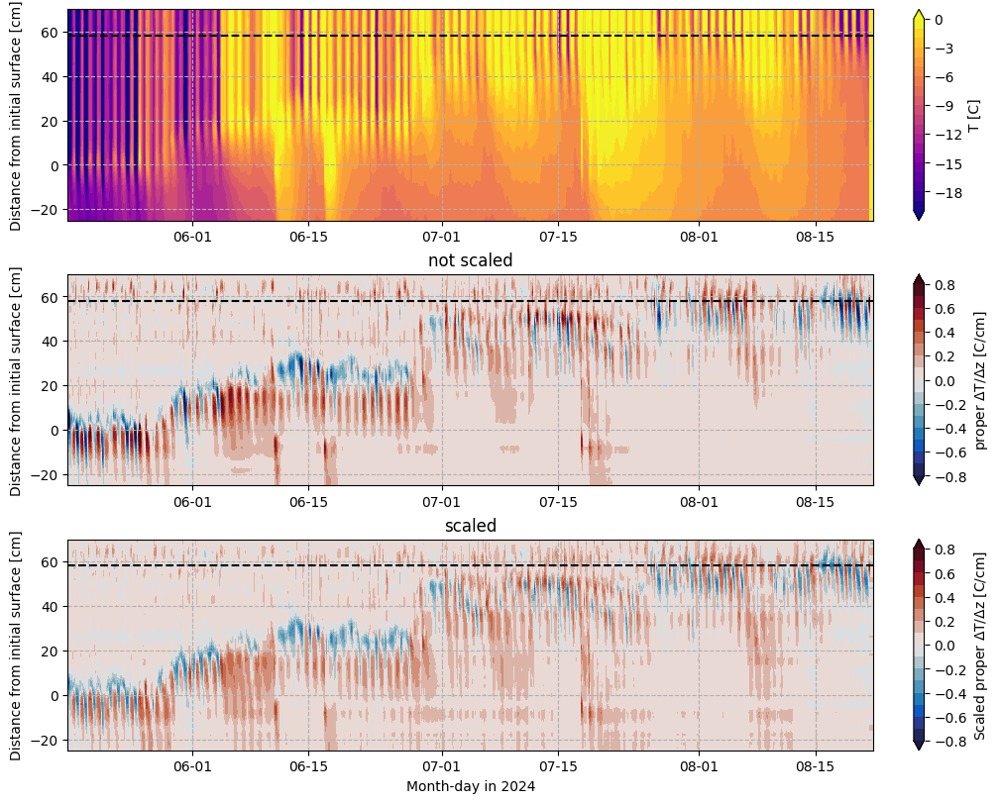

In [658]:

fig, axs = plt.subplots(3, figsize=(10,8), sharey=True, constrained_layout=True)


cb = axs[0].contourf(simba_dates, simba_heights, np.swapaxes(simba_temps,0,1),
                cmap=plt.cm.plasma, levels=np.arange(-20,1,1), extend='both')
plt.colorbar(cb, label='T [C]', ax=axs[0])

axs[1].set_title('not scaled')
cb = axs[1].contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=axs[1])

axs[2].set_title('scaled')
cb = axs[2].contourf(simba_dates, simba_heights, np.swapaxes(scaled_variables['dTdz'],0,1),
                cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
plt.colorbar(cb, label='Scaled proper $\Delta$T/$\Delta$z [C/cm]', ax=axs[2])

for ax in axs.ravel():
    ax.axhline(y=58, c='k', ls='--') ## cutoff from bottom to top thermistor
    ax.grid(ls='--')
    # ax.set_xlim(datetime(2024,5,17), datetime(2024,6,1))
    ax.xaxis.set_major_formatter(myFmt)
    ax.set_ylabel('Distance from initial surface [cm]')

axs[-1].set_xlabel('Month-day in 2024')
    
axs[0].set_ylim(-25,70)
# axs[0].set_ylim(-25,20)

# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

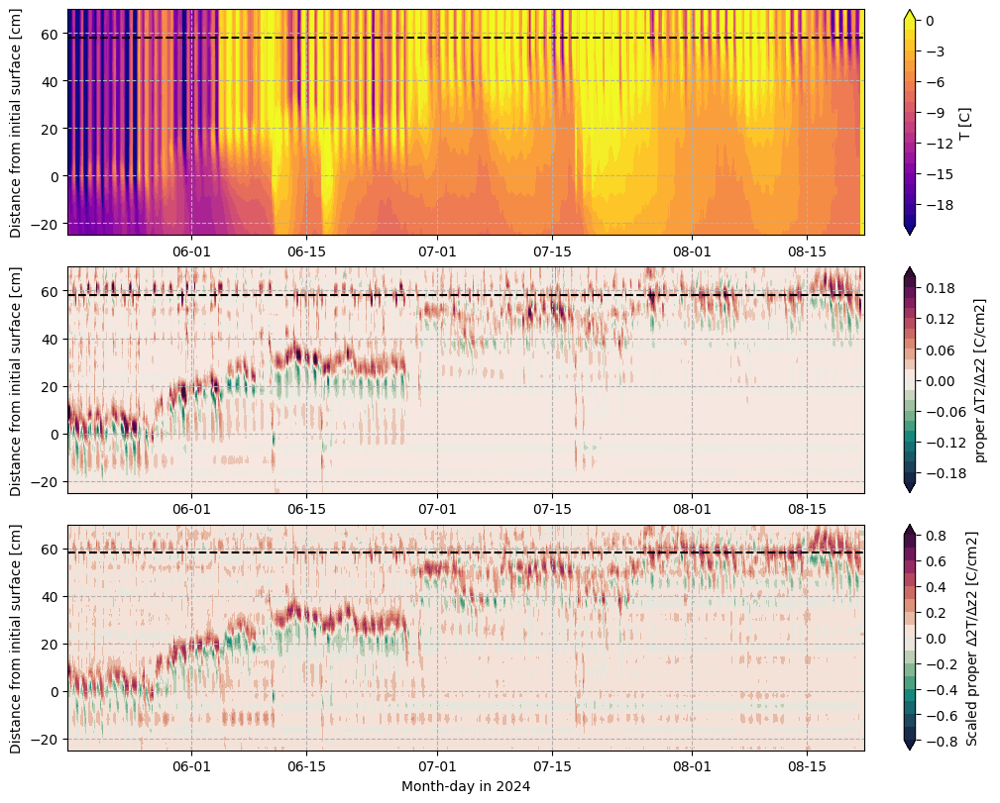

In [43]:

fig, axs = plt.subplots(3, figsize=(10,8), sharey=True, constrained_layout=True)


cb = axs[0].contourf(simba_dates, simba_heights, np.swapaxes(simba_temps,0,1),
                cmap=plt.cm.plasma, levels=np.arange(-20,1,1), extend='both')
plt.colorbar(cb, label='T [C]', ax=axs[0])

cb = axs[1].contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1),
                cmap=cmocean.cm.curl, levels=np.arange(-.2,.21,.02), extend='both')
plt.colorbar(cb, label='proper $\Delta$T2/$\Delta$z2 [C/cm2]', ax=axs[1])

cb = axs[2].contourf(simba_dates, simba_heights, np.swapaxes(scaled_variables['d2Tdz2'],0,1),
                cmap=cmocean.cm.curl, levels=np.arange(-.8,.81,.1), extend='both')
plt.colorbar(cb, label='Scaled proper $\Delta$2T/$\Delta$z2 [C/cm2]', ax=axs[2])

for ax in axs.ravel():
    ax.axhline(y=58, c='k', ls='--') ## cutoff from bottom to top thermistor
    ax.grid(ls='--')
    # ax.set_xlim(datetime(2024,5,17), datetime(2024,6,1))
    ax.xaxis.set_major_formatter(myFmt)
    ax.set_ylabel('Distance from initial surface [cm]')

axs[-1].set_xlabel('Month-day in 2024')
    
axs[0].set_ylim(-25,70)
# axs[0].set_ylim(-25,20)

# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

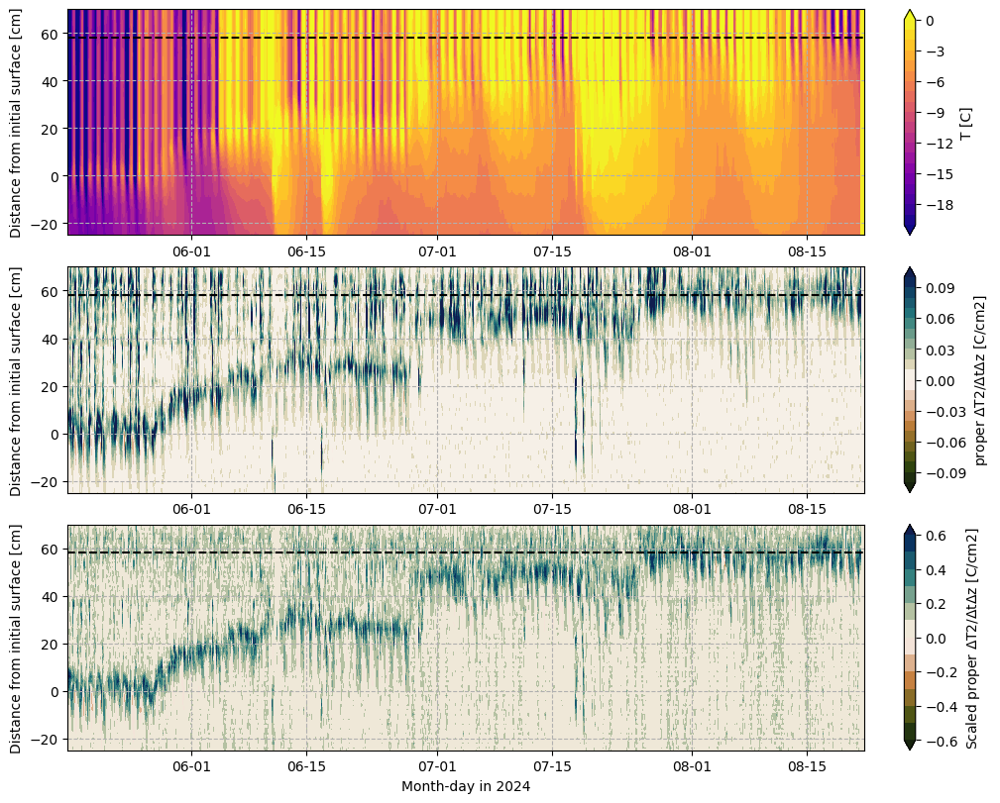

In [677]:

fig, axs = plt.subplots(3, figsize=(10,8), sharey=True, constrained_layout=True)


cb = axs[0].contourf(simba_dates, simba_heights, np.swapaxes(simba_temps,0,1),
                cmap=plt.cm.plasma, levels=np.arange(-20,1,1), extend='both')
plt.colorbar(cb, label='T [C]', ax=axs[0])

cb = axs[1].contourf(simba_dates, simba_heights, np.swapaxes(dTdtdz,0,1),
                cmap=cmocean.cm.tarn, levels=np.arange(-.1,.11,.01), extend='both')
plt.colorbar(cb, label='proper $\Delta$T2/$\Delta$t$\Delta$z [C/cm2]', ax=axs[1])

cb = axs[2].contourf(simba_dates, simba_heights, np.swapaxes(scaled_variables['dTdtdz'],0,1),
                cmap=cmocean.cm.tarn, levels=np.arange(-.6,.61,.1), extend='both')
plt.colorbar(cb, label='Scaled proper $\Delta$T2/$\Delta$t$\Delta$z [C/cm2]', ax=axs[2])

for ax in axs.ravel():
    ax.axhline(y=58, c='k', ls='--') ## cutoff from bottom to top thermistor
    ax.grid(ls='--')
    # ax.set_xlim(datetime(2024,5,17), datetime(2024,6,1))
    ax.xaxis.set_major_formatter(myFmt)
    ax.set_ylabel('Distance from initial surface [cm]')

axs[-1].set_xlabel('Month-day in 2024')
    
axs[0].set_ylim(-25,70)
# axs[0].set_ylim(-25,20)

# plt.savefig(plrams_fpath+'SIMBA_uncorrected_dTdz-d2Tdz2_sfc-detection.png', dpi=300)
plt.show()

## start trying to ID surface, or at least what we think the surface is

In [52]:
simba_dates_2d = np.repeat(simba_dates.copy()[:,np.newaxis], simba_temps.shape[1], axis=1)
simba_heights_2d = np.repeat(simba_heights.copy()[np.newaxis,:], simba_temps.shape[0], axis=0)

### using dT/dz to define the surface

This attempt manually limits where the surface is expected to be and then masks negative(upward?) dT/dz

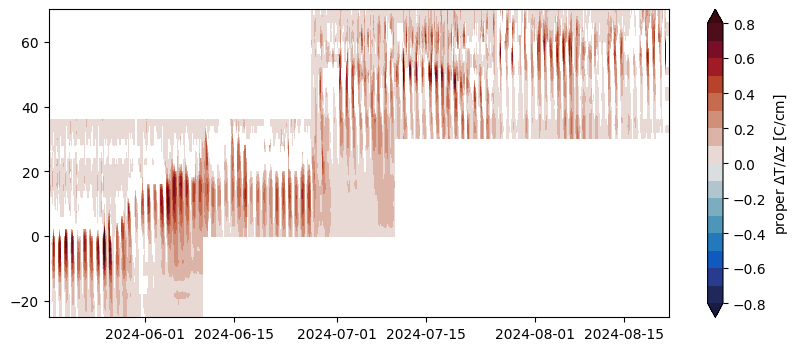

In [79]:
masked_dTdz = np.ma.masked_less(vert_grad.copy(), 0.)
# masked_dTdz = np.ma.masked_less(scaled_variables['dTdz'].copy(), 0)


masked_dTdz = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,27,1))&(simba_heights_2d>36), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,10))&(simba_heights_2d<0), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,7,10))&(simba_heights_2d<30), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,27))&(simba_heights_2d>70), masked_dTdz)


fig, axs = plt.subplots(1, figsize=(10,4))#, sharey=True, constrained_layout=True)

cb = plt.contourf(simba_dates, simba_heights, np.swapaxes(masked_dTdz,0,1),
                cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]')
plt.ylim(-25,70)

plt.show()

In [702]:
masked_T = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,27,1))&(simba_heights_2d>36), simba_temps.copy())
masked_T = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,10))&(simba_heights_2d<0), masked_T)
masked_T = np.ma.masked_where( (simba_dates_2d>datetime(2024,7,10))&(simba_heights_2d<30), masked_T)
masked_T = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,27))&(simba_heights_2d>70), masked_T)

min_temp_height = []

for i in range(masked_dTdz.shape[0]):
    timestep_var = masked_T[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.min(timestep_var))[0]]

    if len(max_height)!=1:
        min_temp_height.append(np.nan)
    else:
        min_temp_height.append(max_height[0])

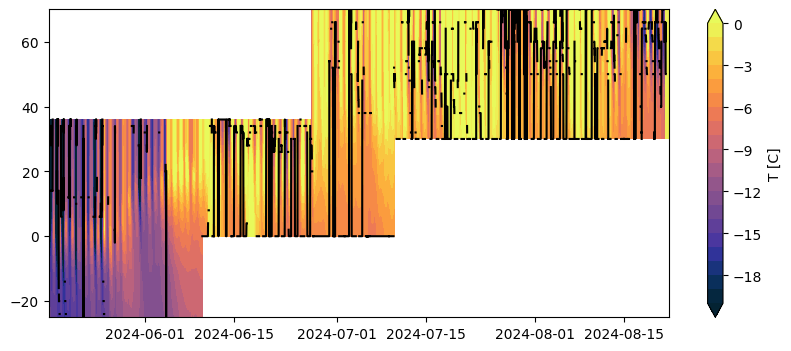

In [704]:
# masked_T = np.ma.masked_less(simba_temps.copy(), 0.)
# masked_dTdz = np.ma.masked_less(scaled_variables['dTdz'].copy(), 0)




fig, axs = plt.subplots(1, figsize=(10,4))#, sharey=True, constrained_layout=True)

plt.plot(simba_dates, min_temp_height, c='k')

cb = plt.contourf(simba_dates, simba_heights, np.swapaxes(masked_T,0,1),
                cmap=cmocean.cm.thermal, levels=np.arange(-20,1,1), extend='both')
plt.colorbar(cb, label='T [C]')
plt.ylim(-25,70)

plt.show()

In [81]:
## still inefficient but understandable
masked_dTdz_sfc = []

for i in range(masked_dTdz.shape[0]):
    timestep_var = masked_dTdz[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]

    if len(max_height)!=1:
        masked_dTdz_sfc.append(np.nan)
    else:
        masked_dTdz_sfc.append(max_height[0])

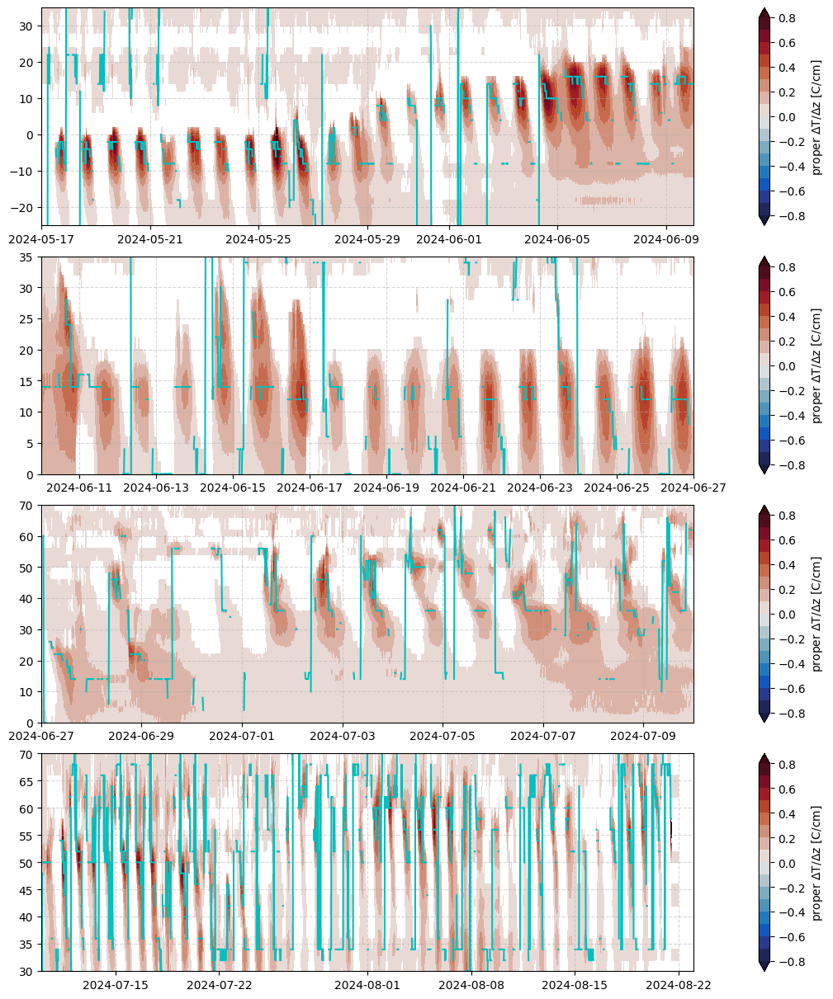

In [83]:
fig, axs = plt.subplots(4, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(masked_dTdz,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, masked_dTdz_sfc, c='c')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

In [549]:
## still inefficient but understandable
masked_d2Tdz2_sfc = []

masked_d2Tdz2 = np.ma.masked_array(scaled_variables['d2Tdz2'], mask=masked_dTdz.mask)

for i in range(masked_d2Tdz2.shape[0]):
    timestep_var = masked_d2Tdz2[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.min(timestep_var))[0]]

    if len(max_height)!=1:
        masked_d2Tdz2_sfc.append(np.nan)
    else:
        masked_d2Tdz2_sfc.append(max_height[0])

In [645]:
## still inefficient but understandable
xtra_masked_d2Tdz2_sfc = []

masked_d2Tdz2 = np.ma.masked_array(scaled_variables['d2Tdz2'], mask=masked_dTdz.mask)
masked_d2Tdz2 = np.ma.masked_where(simba_temps>5, masked_d2Tdz2)

for i in range(masked_d2Tdz2.shape[0]):
    timestep_var = masked_d2Tdz2[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.min(timestep_var))[0]]

    if len(max_height)!=1:
        xtra_masked_d2Tdz2_sfc.append(np.nan)
    else:
        xtra_masked_d2Tdz2_sfc.append(max_height[0])

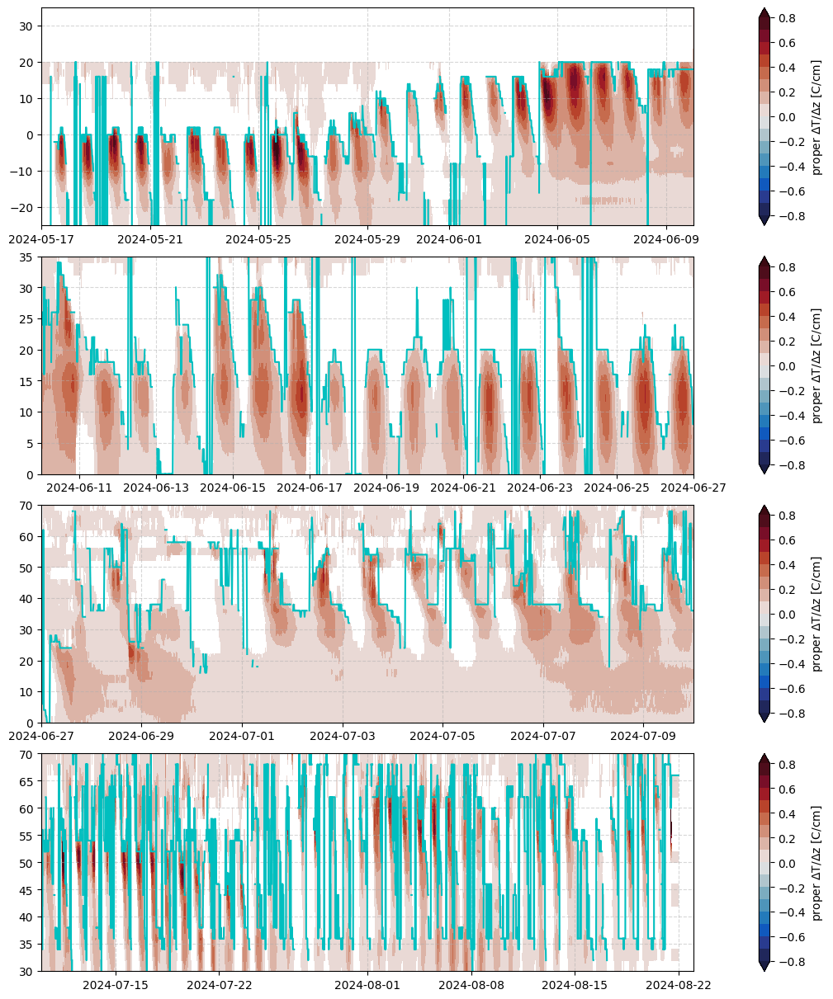

In [550]:
fig, axs = plt.subplots(4, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(masked_dTdz,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, masked_d2Tdz2_sfc, c='c')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

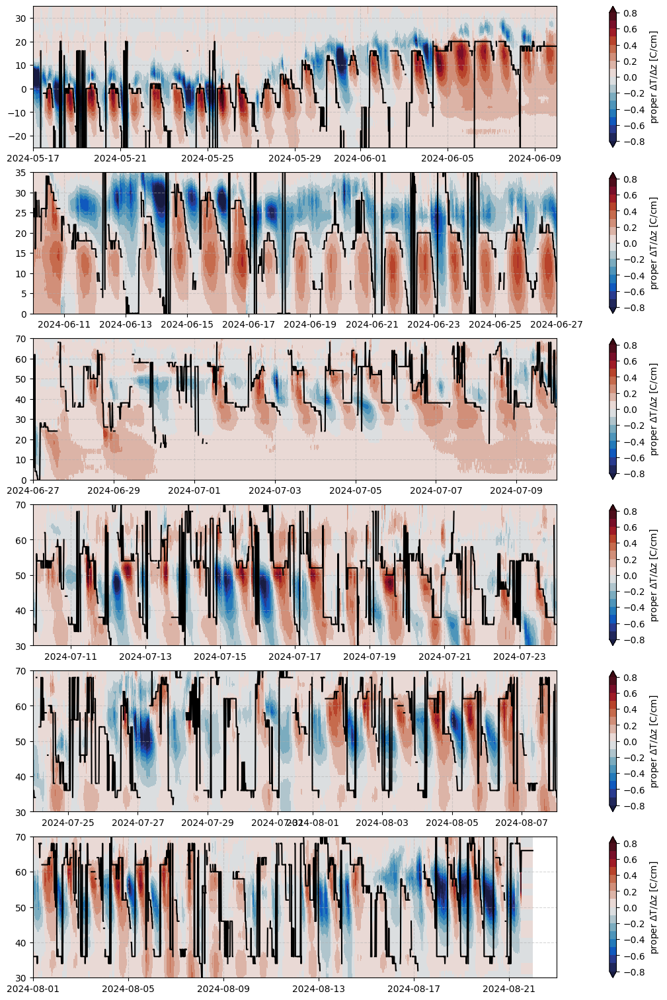

In [551]:
fig, axs = plt.subplots(6, figsize=(10,15),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,7,24)),
         (datetime(2024,7,24),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, masked_d2Tdz2_sfc, c='k')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

New idea: get max surface during noon/late afternoon?

In [646]:
simba_hours = np.array([d.hour for d in simba_dates])
simba_mins = np.array([d.minute for d in simba_dates])

## time of day
simba_tod = simba_hours+simba_mins/60.

In [691]:
masked_simba_tod = np.ma.masked_outside(simba_tod.copy(), 12,19) ## limiting time period to daytime between the hours of 12-19

tod_mask_sfc = np.ma.masked_array(masked_d2Tdz2_sfc.copy(), mask=masked_simba_tod.mask)
simba_dates_tod_mask = np.ma.masked_array(simba_dates.copy(), mask=masked_simba_tod.mask)

In [648]:
## get median for each day?
start_date, end_date = datetime(2024,5,17), datetime(2024,8,21)

sfc_median_day_d2Tdz2 = []
sfc_mean_day_d2Tdz2 = []

sfc_median_dates = []

current_date = start_date
while current_date <= end_date:
    print(current_date)

    date_idx = np.ma.where((simba_dates_tod_mask>=current_date)&(simba_dates_tod_mask<(current_date+timedelta(days=1))) )
    date_sfc = np.ma.masked_invalid(tod_mask_sfc[date_idx])

    if current_date==datetime(2024,6,27):    
        for d in simba_dates[date_idx[0]]:
            sfc_median_day_d2Tdz2.append(np.ma.min(date_sfc))
            sfc_mean_day_d2Tdz2.append(np.ma.min(date_sfc))
    
            sfc_median_dates.append(d)
    # elif current_date ==datetime(2024,6,10):
    #     print('skip')
    ## mannually adjusting some dates that have poor skin temp agreement after correction
    # elif current_date ==datetime(2024,5,21):
    else:
        for d in simba_dates[date_idx[0]]:
            sfc_median_day_d2Tdz2.append(np.ma.median(date_sfc))
            sfc_mean_day_d2Tdz2.append(np.ma.mean(date_sfc))
    
            sfc_median_dates.append(d)
    
    current_date += timedelta(days=1)
    

sfc_median_day_d2Tdz2 = np.array(sfc_median_day_d2Tdz2)
sfc_mean_day_d2Tdz2 = np.array(sfc_mean_day_d2Tdz2)
sfc_median_dates = np.array(sfc_median_dates)

2024-05-17 00:00:00
2024-05-18 00:00:00
2024-05-19 00:00:00
2024-05-20 00:00:00
2024-05-21 00:00:00
2024-05-22 00:00:00
2024-05-23 00:00:00
2024-05-24 00:00:00
2024-05-25 00:00:00
2024-05-26 00:00:00
2024-05-27 00:00:00
2024-05-28 00:00:00
2024-05-29 00:00:00
2024-05-30 00:00:00
2024-05-31 00:00:00
2024-06-01 00:00:00
2024-06-02 00:00:00
2024-06-03 00:00:00
2024-06-04 00:00:00
2024-06-05 00:00:00
2024-06-06 00:00:00
2024-06-07 00:00:00
2024-06-08 00:00:00
2024-06-09 00:00:00
2024-06-10 00:00:00
2024-06-11 00:00:00
2024-06-12 00:00:00
2024-06-13 00:00:00
2024-06-14 00:00:00
2024-06-15 00:00:00
2024-06-16 00:00:00
2024-06-17 00:00:00
2024-06-18 00:00:00
2024-06-19 00:00:00
2024-06-20 00:00:00
2024-06-21 00:00:00
2024-06-22 00:00:00
2024-06-23 00:00:00
2024-06-24 00:00:00
2024-06-25 00:00:00
2024-06-26 00:00:00
2024-06-27 00:00:00
2024-06-28 00:00:00
2024-06-29 00:00:00
2024-06-30 00:00:00
2024-07-01 00:00:00
2024-07-02 00:00:00
2024-07-03 00:00:00
2024-07-04 00:00:00
2024-07-05 00:00:00


In [649]:
# masked_simba_tod = np.ma.masked_outside(simba_tod.copy(), 12,19)

tod_mask_sfc_xtra_mask = np.ma.masked_array(xtra_masked_d2Tdz2_sfc.copy(), mask=masked_simba_tod.mask)
simba_dates_tod_mask = np.ma.masked_array(simba_dates.copy(), mask=masked_simba_tod.mask)

In [650]:
## get median for each day?
start_date, end_date = datetime(2024,5,17), datetime(2024,8,21)

sfc_median_day_d2Tdz2_xtra_mask = []
sfc_mean_day_d2Tdz2_xtra_mask = []

sfc_median_dates_xtra_mask = []

current_date = start_date
while current_date <= end_date:
    print(current_date)

    date_idx = np.ma.where((simba_dates_tod_mask>=current_date)&(simba_dates_tod_mask<(current_date+timedelta(days=1))) )
    date_sfc = np.ma.masked_invalid(tod_mask_sfc_xtra_mask[date_idx])

    if current_date==datetime(2024,6,27):    
        for d in simba_dates[date_idx[0]]:
            sfc_median_day_d2Tdz2_xtra_mask.append(np.ma.min(date_sfc))
            sfc_mean_day_d2Tdz2_xtra_mask.append(np.ma.min(date_sfc))
    
            sfc_median_dates_xtra_mask.append(d)

    else:
        for d in simba_dates[date_idx[0]]:
            sfc_median_day_d2Tdz2_xtra_mask.append(np.ma.median(date_sfc))
            sfc_mean_day_d2Tdz2_xtra_mask.append(np.ma.mean(date_sfc))
    
            sfc_median_dates_xtra_mask.append(d)
    
    current_date += timedelta(days=1)
    

sfc_median_day_d2Tdz2_xtra_mask = np.array(sfc_median_day_d2Tdz2_xtra_mask)
sfc_mean_day_d2Tdz2_xtra_mask = np.array(sfc_mean_day_d2Tdz2_xtra_mask)
sfc_median_dates_xtra_mask = np.array(sfc_median_dates_xtra_mask)

2024-05-17 00:00:00
2024-05-18 00:00:00
2024-05-19 00:00:00
2024-05-20 00:00:00
2024-05-21 00:00:00
2024-05-22 00:00:00
2024-05-23 00:00:00
2024-05-24 00:00:00
2024-05-25 00:00:00
2024-05-26 00:00:00
2024-05-27 00:00:00
2024-05-28 00:00:00
2024-05-29 00:00:00
2024-05-30 00:00:00
2024-05-31 00:00:00
2024-06-01 00:00:00
2024-06-02 00:00:00
2024-06-03 00:00:00
2024-06-04 00:00:00
2024-06-05 00:00:00
2024-06-06 00:00:00
2024-06-07 00:00:00
2024-06-08 00:00:00
2024-06-09 00:00:00
2024-06-10 00:00:00
2024-06-11 00:00:00
2024-06-12 00:00:00
2024-06-13 00:00:00
2024-06-14 00:00:00
2024-06-15 00:00:00
2024-06-16 00:00:00
2024-06-17 00:00:00
2024-06-18 00:00:00
2024-06-19 00:00:00
2024-06-20 00:00:00
2024-06-21 00:00:00
2024-06-22 00:00:00
2024-06-23 00:00:00
2024-06-24 00:00:00
2024-06-25 00:00:00
2024-06-26 00:00:00
2024-06-27 00:00:00
2024-06-28 00:00:00
2024-06-29 00:00:00
2024-06-30 00:00:00
2024-07-01 00:00:00
2024-07-02 00:00:00
2024-07-03 00:00:00
2024-07-04 00:00:00
2024-07-05 00:00:00


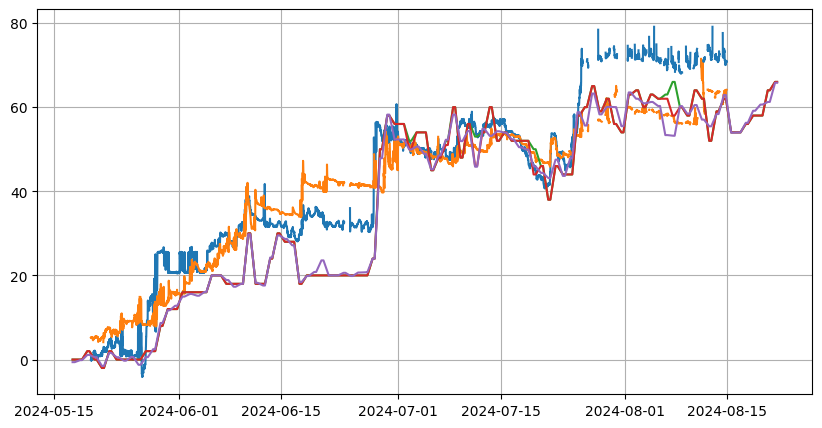

In [651]:
plt.figure(figsize=(10,5))

plt.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
plt.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')
plt.plot(sfc_median_dates, sfc_median_day_d2Tdz2)
plt.plot(sfc_median_dates_xtra_mask, sfc_median_day_d2Tdz2_xtra_mask)
plt.plot(sfc_median_dates_xtra_mask, sfc_mean_day_d2Tdz2_xtra_mask)
plt.grid()
plt.show()

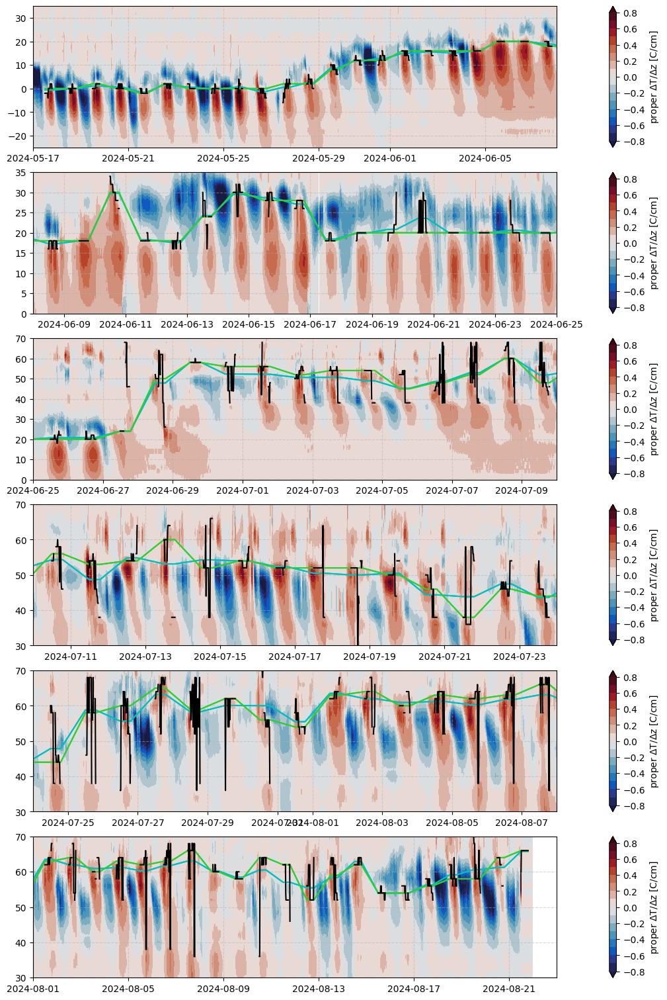

In [668]:
fig, axs = plt.subplots(6, figsize=(10,15),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,8)), (datetime(2024,6,8),datetime(2024,6,25)),
         (datetime(2024,6,25),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,7,24)),
         (datetime(2024,7,24),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)


    ax.plot(sfc_median_dates, sfc_mean_day_d2Tdz2, c='c')
    ax.plot(sfc_median_dates, sfc_median_day_d2Tdz2, c='limegreen')


    ax.plot(sfc_median_dates, sfc_mean_day_d2Tdz2, c='c')
    ax.plot(sfc_median_dates, sfc_median_day_d2Tdz2, c='limegreen')

    ax.plot(simba_dates, tod_mask_sfc, c='k')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

In [ ]:
frankenstein_sfc = sfc_median_day_d2Tdz2_xtra_mask.copy()

frankenstein_sfc = np.where(()&(), frankenstein_sfc)

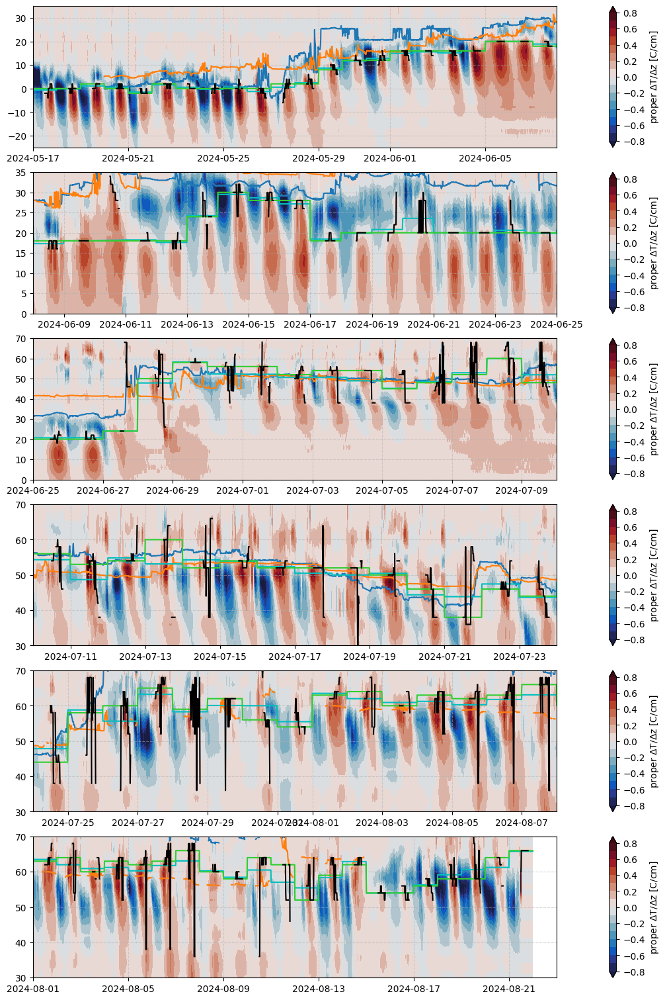

In [607]:
fig, axs = plt.subplots(6, figsize=(10,15),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,8)), (datetime(2024,6,8),datetime(2024,6,25)),
         (datetime(2024,6,25),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,7,24)),
         (datetime(2024,7,24),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')

    ax.plot(sfc_median_dates, sfc_mean_day_d2Tdz2, c='c')
    ax.plot(sfc_median_dates, sfc_median_day_d2Tdz2, c='limegreen')

    ax.plot(simba_dates, tod_mask_sfc, c='k')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

In [620]:
data_to_write = zip(sfc_median_dates, sfc_median_day_d2Tdz2)

filename = "/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_median-daytime-bin_v2_20250711.csv"
header = ["datetime", "surface [cm]"]

with open(filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(header)  # Write the header row
    writer.writerows(data_to_write) # Write all data rows

print(f"Data with timestamps successfully written to {filename}")

Data with timestamps successfully written to Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_median-daytime-bin_v2_20250711.csv


In [624]:
data_to_write = zip(sfc_median_dates, sfc_mean_day_d2Tdz2)

filename = "/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_mean-daytime-bin_v2_20250711.csv"
header = ["datetime", "surface [cm]"]

with open(filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(header)  # Write the header row
    writer.writerows(data_to_write) # Write all data rows

print(f"Data with timestamps successfully written to {filename}")

Data with timestamps successfully written to /home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_mean-daytime-bin_v2_20250711.csv


In [630]:
## writing files with extra mask based on temperature
data_to_write = zip(sfc_median_dates_xtra_mask, sfc_median_day_d2Tdz2_xtra_mask)

filename = "/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_median-daytime-bin_5T-mask_v2.1_20250711.csv"
header = ["datetime", "surface [cm]"]

with open(filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(header)  # Write the header row
    writer.writerows(data_to_write) # Write all data rows


data_to_write = zip(sfc_median_dates_xtra_mask, sfc_mean_day_d2Tdz2_xtra_mask)

filename = "/home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_mean-daytime-bin_5T-mask_v2.1_20250711.csv"
header = ["datetime", "surface [cm]"]

with open(filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(header)  # Write the header row
    writer.writerows(data_to_write) # Write all data rows

print(f"Data with timestamps successfully written to {filename}")

Data with timestamps successfully written to /home/asledd/ICECAPS/Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_mean-daytime-bin_5T-mask_v2.1_20250711.csv


### try adding dT/dz variance as condition

In [678]:
## calculate dT/dz variances with different window sizes
variances_center = {}

# windows = [4, 4*2, 4*4, 4*6, 4*10, 4*12, 4*18, 4*24, 4*48]
windows = 4*np.arange(4,25,4)

# for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):
for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','dTdtdz']):

    variances_center[label] = {}
    print(label)
    for window in windows:
        print(window)
        
        for i in range(vert_grad.shape[0]):
            # if i-int(window/2)<0:
            #     time_step_var = np.full(var.shape[0], -999)
            #     if i==0:
            #         rolling_var_from_vert_win = time_step_var[np.newaxis,:]
            #     else:
            #         rolling_var_from_vert_win = np.ma.concatenate((rolling_var_from_vert_win, time_step_var[np.newaxis,:]))
            #     continue
            # print(i-window/2, i+window/2+1)

            try:
                time_step_var = np.ma.var(np.ma.masked_invalid(var[i-int(window/2):i+int(window/2)+1,:]), axis=0)
            except:
                time_step_var = np.full(var.shape[0], -999)
                print(simba_dates[i], np.shape(time_step_var))
            # print(i, time_step_var.shape)
            if i==0:
                rolling_var_from_vert_win = time_step_var[np.newaxis,:]
            else:
                rolling_var_from_vert_win = np.ma.concatenate((rolling_var_from_vert_win, time_step_var[np.newaxis,:]))
                
        variances_center[label][window] = rolling_var_from_vert_win
print(variances_center.keys())

dTdz
16
32
48
64
80
96
d2Tdz2
16
32
48
64
80
96
T
16
32
48
64
80
96
dTdt
16
32
48
64
80
96
dTdtdz
16
32
48
64
80
96
dict_keys(['dTdz', 'd2Tdz2', 'T', 'dTdt', 'dTdtdz'])


In [679]:
scaled_variances_center = {}
for varname in variances_center:
    print(varname)
    scaled_variances_center[varname] = {}
    for win in variances_center[varname]:
    
        # if win in []
        data = np.copy(variances_center[varname][win])
        data[np.where(simba_heights_2d>100)] = 0.
        data[np.where(simba_heights_2d<-50)] = 0.

        scaled_variances_center[varname][win] = preprocessing.normalize(data, axis=1)

dTdz
d2Tdz2
T
dTdt
dTdtdz


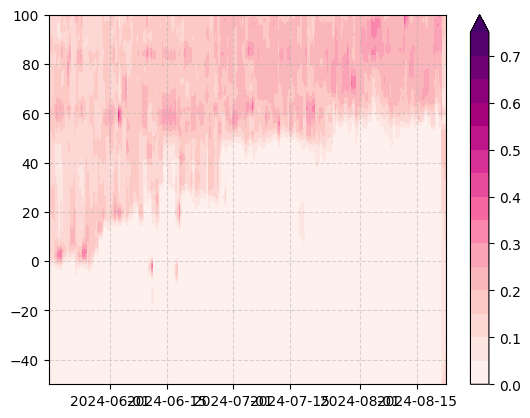

In [680]:
cb = plt.contourf(simba_dates,simba_heights,np.swapaxes(scaled_variances_center['dTdtdz'][24*4],0,1), 
                  levels=np.arange(0,0.8,.05), extend='max', cmap=plt.cm.RdPu)
plt.colorbar(cb)
plt.grid(alpha=.5, ls='--')
plt.ylim(-50,100)
# plt.xlim(datetime(2024,8,1),datetime(2024,8,23))
plt.show()

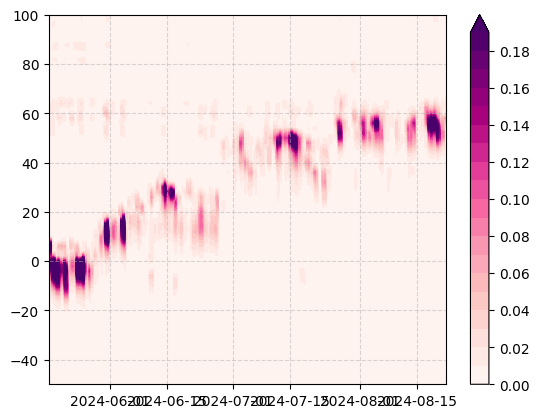

In [681]:
cb = plt.contourf(simba_dates,simba_heights,np.swapaxes(variances_center['dTdz'][24*4],0,1), 
                  levels=np.arange(0,0.2,.01), extend='max', cmap=plt.cm.RdPu)
plt.colorbar(cb)
plt.grid(alpha=.5, ls='--')
plt.ylim(-50,100)
# plt.xlim(datetime(2024,8,1),datetime(2024,8,23))
plt.show()

In [688]:
masked_dTdz = np.ma.masked_less(second_vert_grad.copy(), 0.)
# masked_dTdz = np.ma.masked_less(scaled_variables['dTdz'].copy(), 0)

masked_dTdz = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,27,1))&(simba_heights_2d>36), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,10))&(simba_heights_2d<0), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,7,10))&(simba_heights_2d<30), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,27))&(simba_heights_2d>70), masked_dTdz)

masked_dTdz = np.ma.masked_where( scaled_variances_center['dTdz'][24*4]<0.01, masked_dTdz)
# masked_dTdz = np.ma.masked_where( scaled_variances_center['dTdtdz'][24*4]>0.2, masked_dTdz) 

In [689]:
masked_d2Tdz2_sfc = []

masked_d2Tdz2 = np.ma.masked_array(second_vert_grad, mask=masked_dTdz.mask)

for i in range(masked_d2Tdz2.shape[0]):
    timestep_var = masked_d2Tdz2[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.min(timestep_var))[0]]

    if len(max_height)!=1:
        masked_d2Tdz2_sfc.append(np.nan)
    else:
        masked_d2Tdz2_sfc.append(max_height[0])

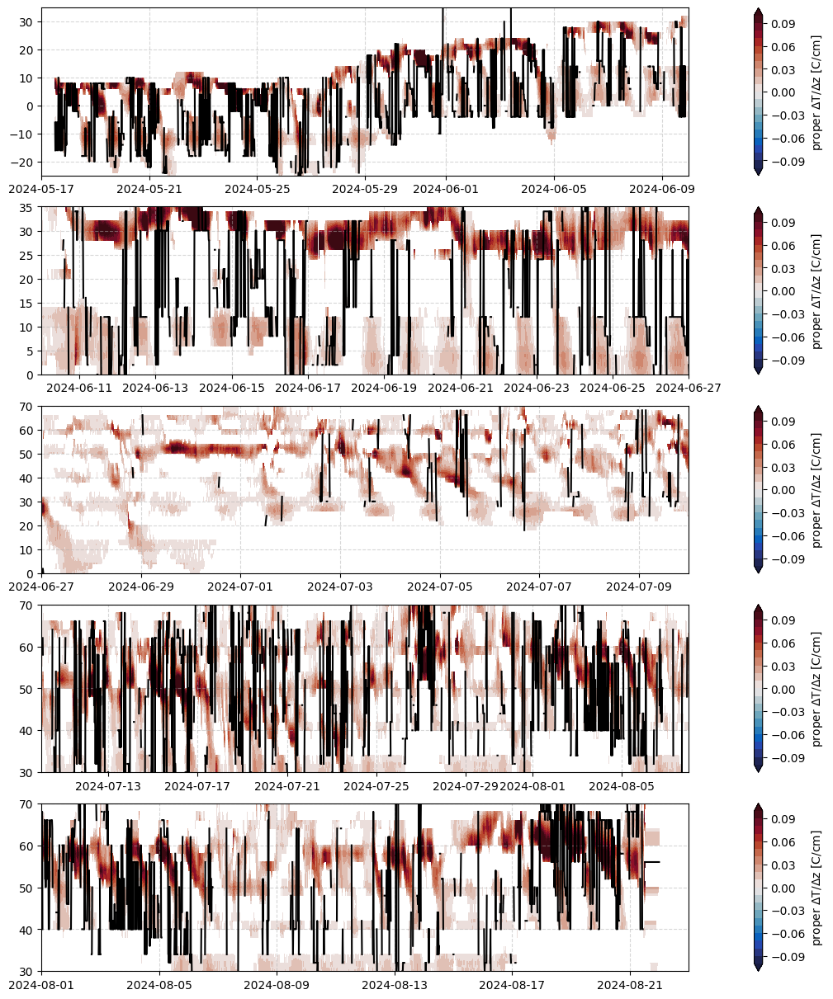

In [690]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(masked_d2Tdz2,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.1,.11,.01), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, masked_d2Tdz2_sfc, c='k')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

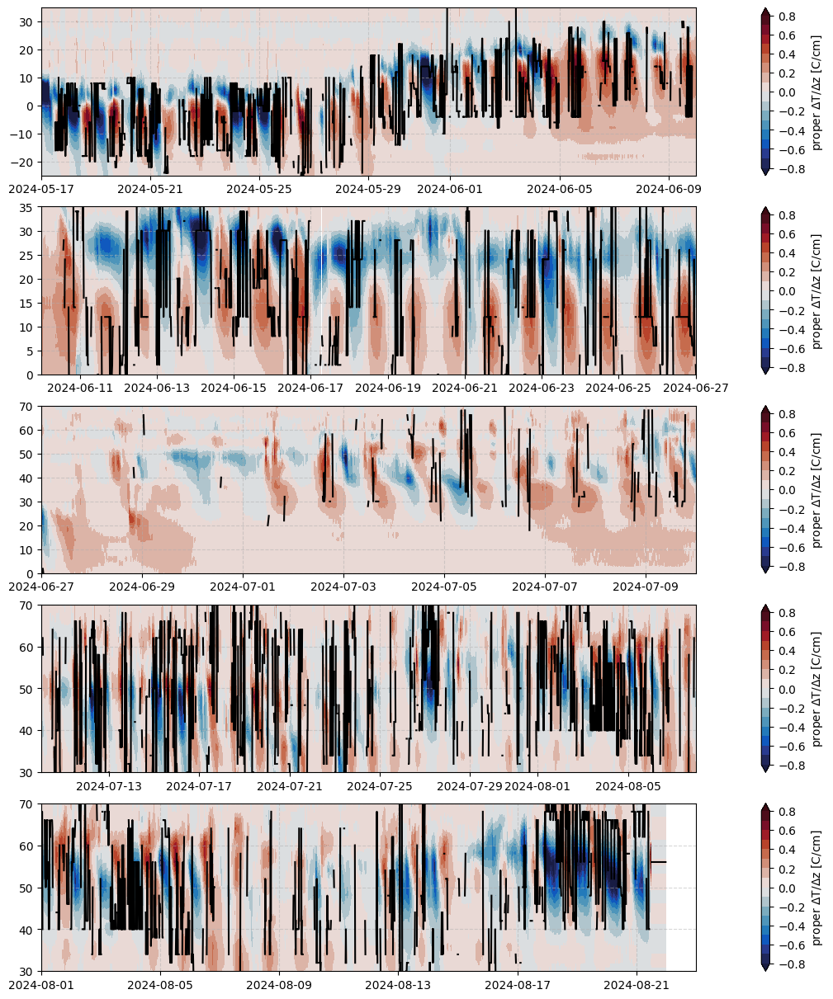

In [153]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, masked_d2Tdz2_sfc, c='k')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

#### definining surface as maximum dT/dz variance?

In [171]:
masked_dTdz = np.ma.masked_less(vert_grad.copy(), 0.)
# masked_dTdz = np.ma.masked_less(scaled_variables['dTdz'].copy(), 0)

masked_dTdz = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,27,1))&(simba_heights_2d>36), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,10))&(simba_heights_2d<0), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d<datetime(2024,6,10))&(simba_heights_2d>20), masked_dTdz)

masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,7,10))&(simba_heights_2d<30), masked_dTdz)
masked_dTdz = np.ma.masked_where( (simba_dates_2d>datetime(2024,6,27))&(simba_heights_2d>70), masked_dTdz)

In [770]:
max_var_sfcs = {}

## mask out increased variances from percolation event that caused water below the surface
perc_date_idx = np.where( (simba_dates>=datetime(2024,6,10))&(simba_dates<datetime(2024,6,11)) )[0]
perc_depth_idx = np.where(simba_heights<10)[0]
# print(simba_heights[perc_depth_idx])


for var in scaled_variances_center:
    max_var_sfcs[var] = {}
    for win in scaled_variances_center[var]:
        masked_dTdz_var = np.copy(scaled_variances_center[var][win])# np.ma.masked_array(scaled_variances_center['dTdz'][24*4], mask=masked_dTdz.mask)
    
        masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,6,10))&(simba_dates_2d<datetime(2024,6,11))&(simba_heights_2d<10), 0, masked_dTdz_var)
        masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,6,19))&(simba_dates_2d<datetime(2024,6,21))&(simba_heights_2d>25), 0, masked_dTdz_var)
        masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,7,19))&(simba_dates_2d<datetime(2024,7,21))&(simba_heights_2d>45), 0, masked_dTdz_var)
        masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,6,7))&(simba_dates_2d<datetime(2024,6,13,12))&(simba_heights_2d>20), 0, masked_dTdz_var)
        masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,6,10))&(simba_dates_2d<datetime(2024,6,13))&(simba_heights_2d<10), 0, masked_dTdz_var)

        # cb = plt.contourf(simba_dates, simba_heights, np.swapaxes(masked_dTdz_var,0,1),
        #                 cmap=plt.cm.RdPu, levels=np.arange(0,.41,.05), extend='max')
        # plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]')
        # plt.xlim(datetime(2024,6,8),datetime(2024,6,5))
        # plt.axhline(y=10)
        # plt.show()
        win_sfc = []
        for i in range(masked_dTdz_var.shape[0]):
            timestep_var = masked_dTdz_var[i,:]
            max_height = simba_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]
        
            if len(max_height)!=1:
                win_sfc.append(np.nan)
            else:
                win_sfc.append(max_height[0])
        
        max_var_sfcs[var][win] = np.array(win_sfc)

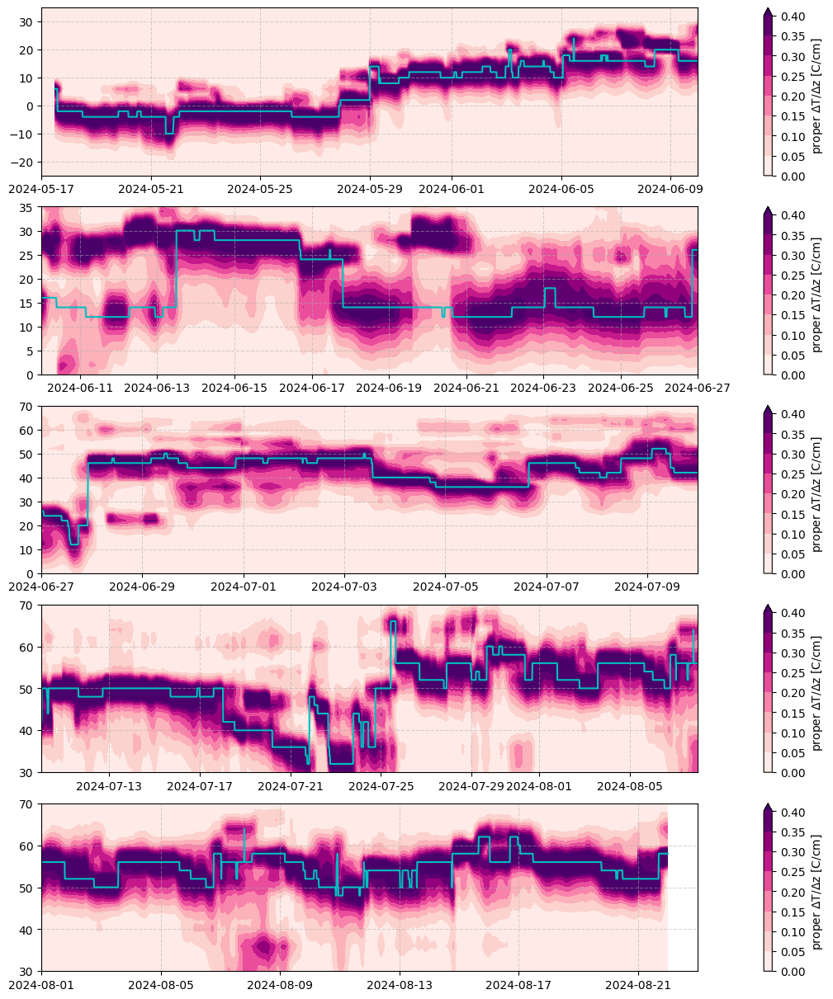

In [771]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances_center['dTdz'][24*4],0,1),
                    cmap=plt.cm.RdPu, levels=np.arange(0,.41,.05), extend='max')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs['dTdz'][24*4], c='c')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

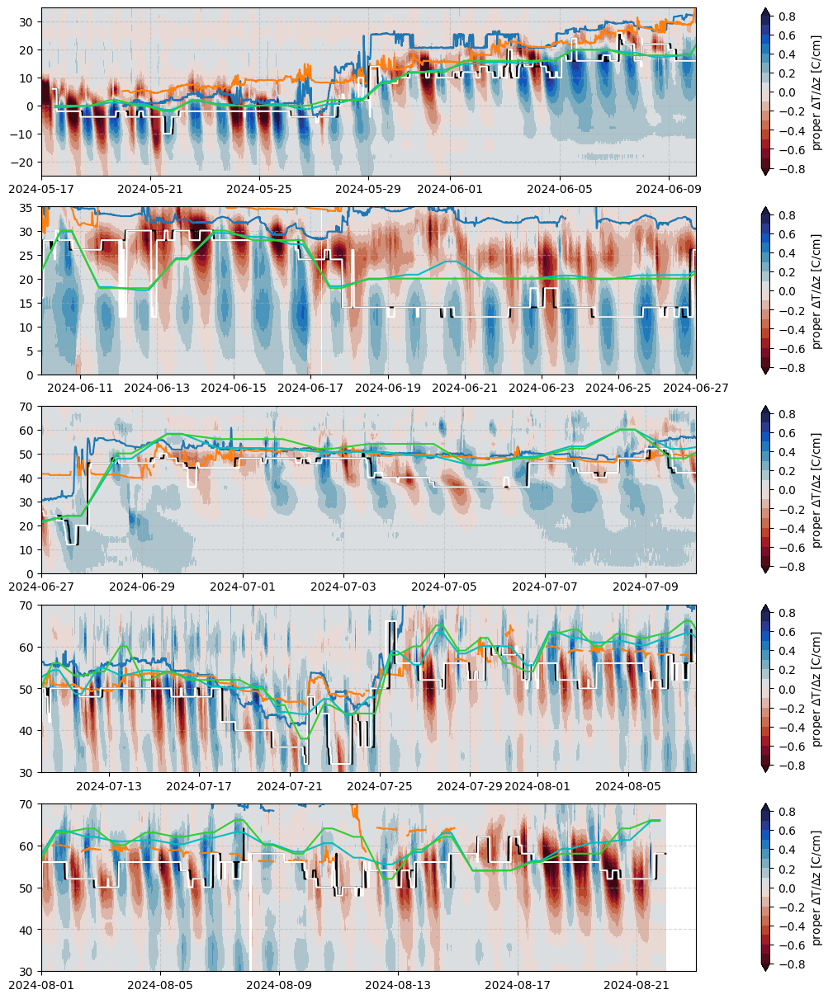

In [671]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance_r, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')
    
    ax.plot(simba_dates, max_var_sfcs['dTdz'][24*4], c='k')
    ax.plot(simba_dates, max_var_sfcs['dTdz'][20*4], c='w')

    ax.plot(sfc_median_dates, sfc_mean_day_d2Tdz2, c='c')
    ax.plot(sfc_median_dates, sfc_median_day_d2Tdz2, c='limegreen')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')


    
plt.show()

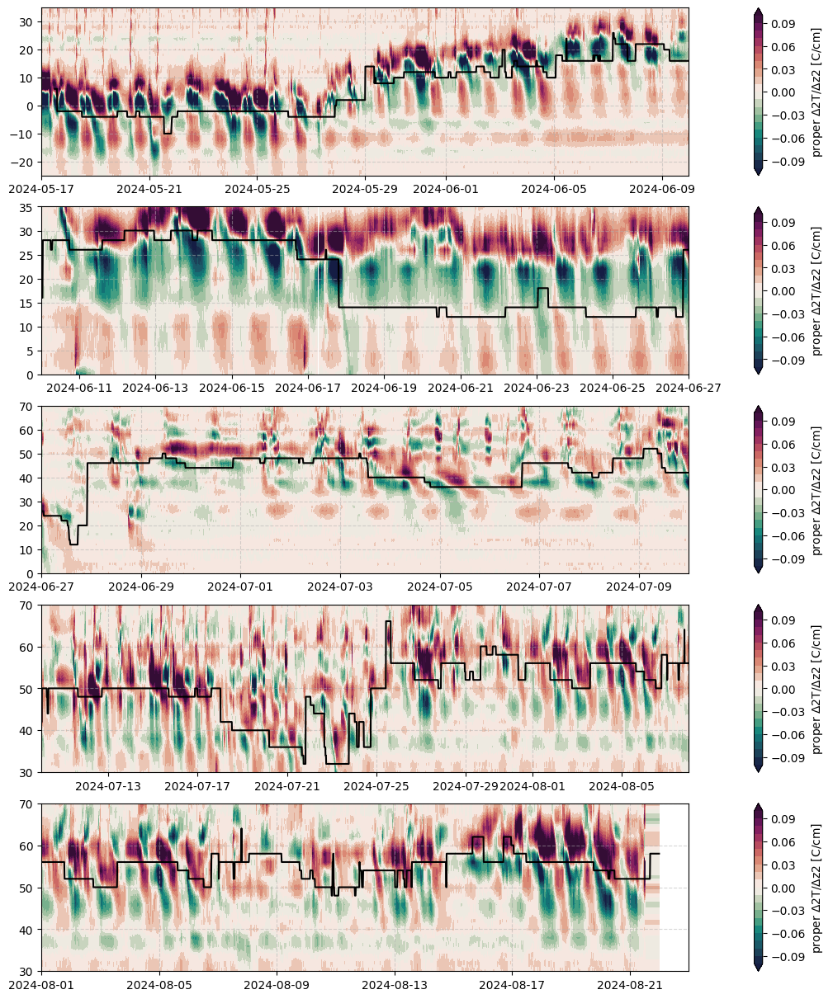

In [443]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1),
                    cmap=cmocean.cm.curl, levels=np.arange(-.1,.11,.01), extend='both')
    plt.colorbar(cb, label='proper $\Delta$2T/$\Delta$z2 [C/cm]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs[24*4], c='k')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

#### idea to use 24-hour variance as an initial guess and then use a different varaible to get a higher frequency surface detection

In [444]:
upper_sfc_lim = np.copy(max_var_sfcs[24*4])+10.
lower_sfc_lim = np.copy(max_var_sfcs[24*4])-5.

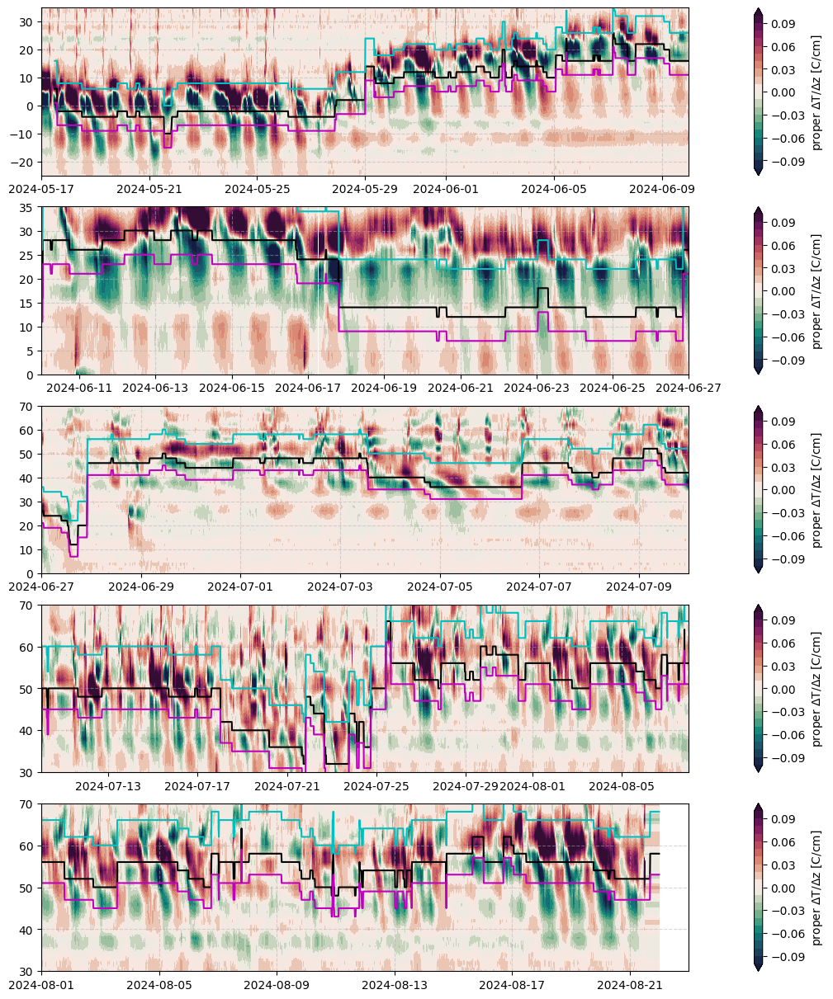

In [445]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1),
                    cmap=cmocean.cm.curl, levels=np.arange(-.1,.11,.01), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    ax.plot(simba_dates, upper_sfc_lim, c='c')
    ax.plot(simba_dates, lower_sfc_lim, c='m')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

In [446]:
lower_2d = np.repeat(lower_sfc_lim[:,np.newaxis],simba_heights.shape,axis=1)
upper_2d = np.repeat(upper_sfc_lim[:,np.newaxis],simba_heights.shape,axis=1)

In [447]:
d2Tdz2_masked_outside = np.ma.masked_where( simba_heights_2d>upper_2d, np.copy(second_vert_grad))
d2Tdz2_masked_outside = np.ma.masked_where( simba_heights_2d<lower_2d, d2Tdz2_masked_outside)

In [448]:
limited_sfc = []

# masked_dTdz_var =scaled_variances_center['dTdz'][24*4]# np.ma.masked_array(scaled_variances_center['dTdz'][24*4], mask=masked_dTdz.mask)

for i in range(d2Tdz2_masked_outside.shape[0]):
    timestep_var = d2Tdz2_masked_outside[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.min(timestep_var))[0]]

    if len(max_height)!=1:
        limited_sfc.append(np.nan)
    else:
        limited_sfc.append(max_height[0])

limited_sfc = np.array(limited_sfc)

In [706]:
def find_nearest(array, value):
    # array = np.asarray(array)
    idx = (np.ma.abs(array - value)).argmin()
    return array[idx]

In [772]:
### only look ABOVE height of maximum variance for a threshold of dT/dz variance that matches demob height

dTdz_threshold_sfc = []

masked_dTdz_var = scaled_variances_center['dTdz'][24*4]# np.ma.masked_array(scaled_variances_center['dTdz'][24*4], mask=masked_dTdz.mask)

for i in range(masked_dTdz_var.shape[0]):

    timestep_var = np.ma.masked_where(simba_heights<=max_var_sfcs['dTdz'][24*4][i], masked_dTdz_var[i,:])
    # timestep_var = np.ma.masked_where(simba_heights>max_var_sfcs['dTdz'][24*4][i]+8., timestep_var)

    # want first instance of lower value
    lower_idx = np.ma.where(timestep_var<=0.25)[0][0] # value is manually chosen based on plots of dTdz 24 hour variance
    # print(lower_idx)
    
    max_height = simba_heights[np.ma.where(timestep_var==timestep_var[lower_idx])[0]]

    if len(max_height)!=1:
        dTdz_threshold_sfc.append(np.nan)
    else:
        dTdz_threshold_sfc.append(max_height[0])

dTdz_threshold_sfc = np.array(dTdz_threshold_sfc)

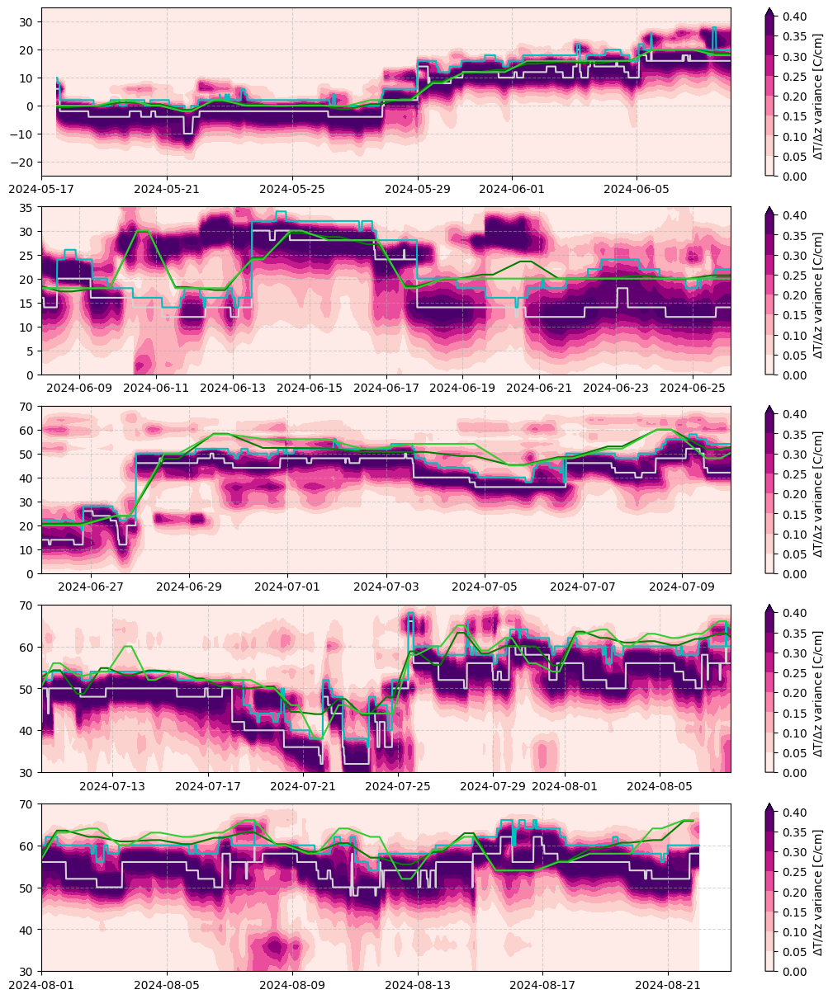

In [800]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,8)), (datetime(2024,6,8),datetime(2024,6,26)),
         (datetime(2024,6,26),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(scaled_variances_center['dTdz'][24*4],0,1),
                    cmap=plt.cm.RdPu, levels=np.arange(0,.41,.05), extend='max')
    plt.colorbar(cb, label='$\Delta$T/$\Delta$z variance [C/cm]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs['dTdz'][24*4], c='lightgrey')
    ax.plot(simba_dates, dTdz_threshold_sfc, c='c')

    ax.plot(sfc_median_dates, sfc_mean_day_d2Tdz2, c='g')
    ax.plot(sfc_median_dates, sfc_median_day_d2Tdz2, c='limegreen')
    
    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

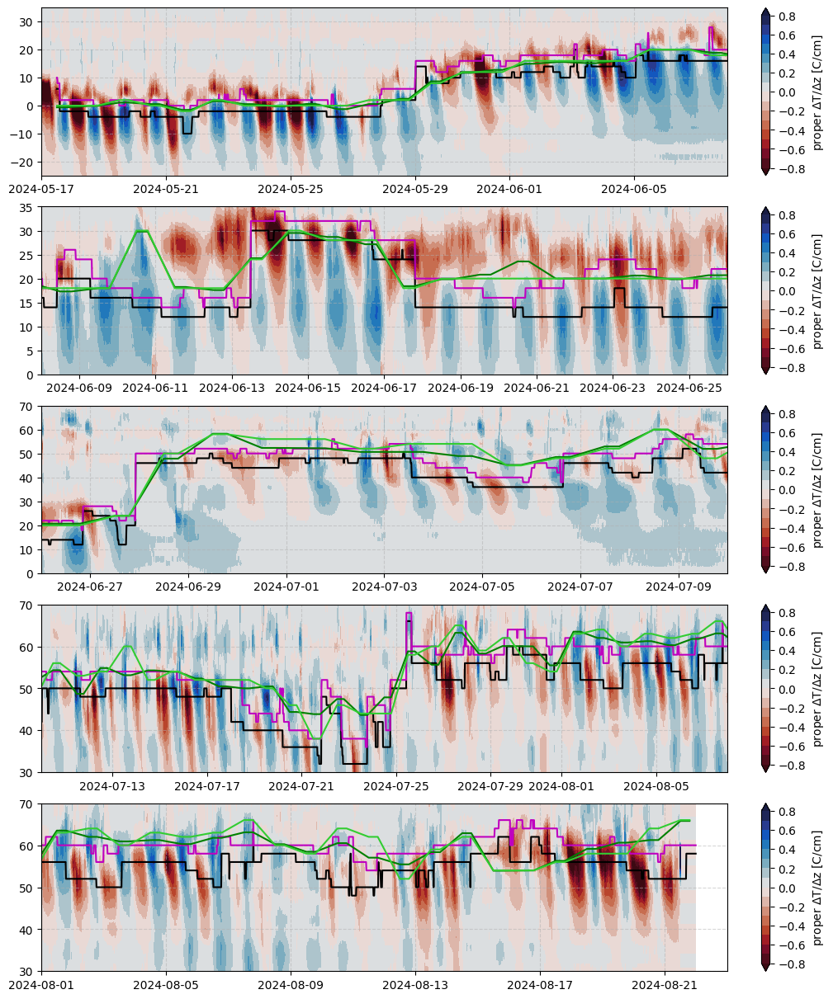

In [804]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,8)), (datetime(2024,6,8),datetime(2024,6,26)),
         (datetime(2024,6,26),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance_r, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs['dTdz'][24*4], c='k')
    ax.plot(simba_dates, dTdz_threshold_sfc, c='m')

    ax.plot(sfc_median_dates, sfc_mean_day_d2Tdz2, c='g')
    ax.plot(sfc_median_dates, sfc_median_day_d2Tdz2, c='limegreen')
    
    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

Comparing sfc id methods with wind speed

In [783]:
print(wind_spd_all.shape, simba_dates.shape, np.shape(dTdz_threshold_sfc), sfc_median_day_d2Tdz2.shape)

(9312,) (9312,) (9312,) (2813,)


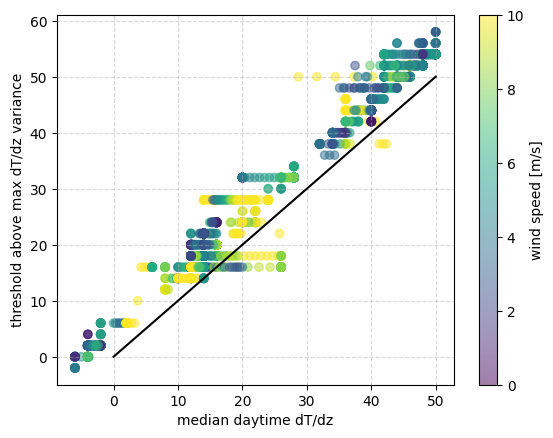

In [792]:
# wind_spd_all

# f_sfc = interpolate.interp1d(sfc_seconds, simba_sfc_in, fill_value=-999, bounds_error=False)
# simba_sfc = f_sfc(simba_seconds)
# simba_sfc = np.ma.masked_equal(simba_sfc, -999)

# smoothed_filled_sfc interpolated lower down
cb = plt.scatter(smoothed_filled_sfc, dTdz_threshold_sfc, c=wind_spd_all, alpha=.5, vmin=0., vmax=10)
plt.colorbar(cb, label='wind speed [m/s]')
plt.xlabel('median daytime dT/dz')
plt.ylabel('threshold above max dT/dz variance')
plt.plot([0,50],[0,50], c='k')
plt.grid(alpha=.5, ls='--')
plt.show()

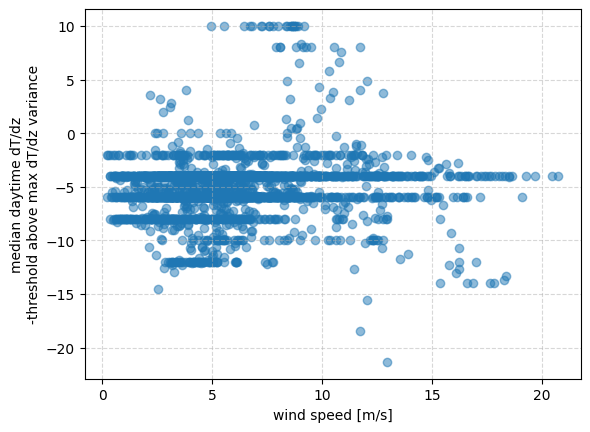

In [790]:
# wind_spd_all

# f_sfc = interpolate.interp1d(sfc_seconds, simba_sfc_in, fill_value=-999, bounds_error=False)
# simba_sfc = f_sfc(simba_seconds)
# simba_sfc = np.ma.masked_equal(simba_sfc, -999)

# smoothed_filled_sfc interpolated lower down
cb = plt.scatter(wind_spd_all, smoothed_filled_sfc-dTdz_threshold_sfc, alpha=.5)
plt.xlabel('wind speed [m/s]')
# plt.xlabel('')
plt.ylabel('median daytime dT/dz\n-threshold above max dT/dz variance')
# plt.plot([0,50],[0,50], c='k')
plt.grid(alpha=.5, ls='--')
plt.show()

In [793]:
## combining? in solar bias, surface looks better under high wind speeds with smoothed_filled_sfc, otherwise dTdz_threshold_sfc
combined_sfc = np.ma.copy(dTdz_threshold_sfc)

hi_wspd_idx = np.where(wind_spd_all>6) # 6 m/s is the lower threshold for the fastest wind speed bin in the solar correction
combined_sfc[hi_wspd_idx] = smoothed_filled_sfc[hi_wspd_idx]

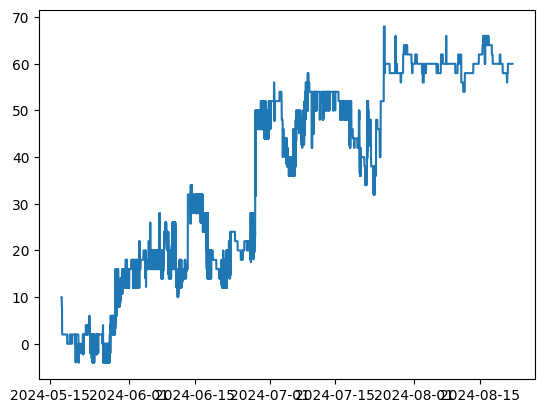

In [794]:
plt.plot(simba_dates, combined_sfc)
plt.show()

In [449]:

d2Tdz2_var_masked_outside = np.ma.masked_where( simba_heights_2d>upper_2d, np.copy(scaled_variances_center['d2Tdz2'][12*4]))
d2Tdz2_var_masked_outside = np.ma.masked_where( simba_heights_2d<lower_2d, d2Tdz2_var_masked_outside)
limited_sfc_var = []

# masked_dTdz_var =scaled_variances_center['dTdz'][24*4]# np.ma.masked_array(scaled_variances_center['dTdz'][24*4], mask=masked_dTdz.mask)

for i in range(d2Tdz2_var_masked_outside.shape[0]):
    timestep_var = d2Tdz2_var_masked_outside[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]

    if len(max_height)!=1:
        limited_sfc_var.append(np.nan)
    else:
        limited_sfc_var.append(max_height[0])

limited_sfc_var = np.array(limited_sfc_var)

In [450]:

# d2Tdz2_var_masked_outside = np.ma.masked_where( simba_heights_2d>upper_2d, np.copy(scaled_variances_center['d2Tdz2'][12*4]))
# d2Tdz2_var_masked_outside = np.ma.masked_where( simba_heights_2d<lower_2d, d2Tdz2_var_masked_outside)
detect_var = scaled_variances_center['d2Tdz2'][12*4]

sfc_second_var = []

# masked_dTdz_var =scaled_variances_center['dTdz'][24*4]# np.ma.masked_array(scaled_variances_center['dTdz'][24*4], mask=masked_dTdz.mask)

for i in range(detect_var.shape[0]):
    timestep_var = detect_var[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]

    if len(max_height)!=1:
        sfc_second_var.append(np.nan)
    else:
        sfc_second_var.append(max_height[0])

sfc_second_var = np.array(sfc_second_var)

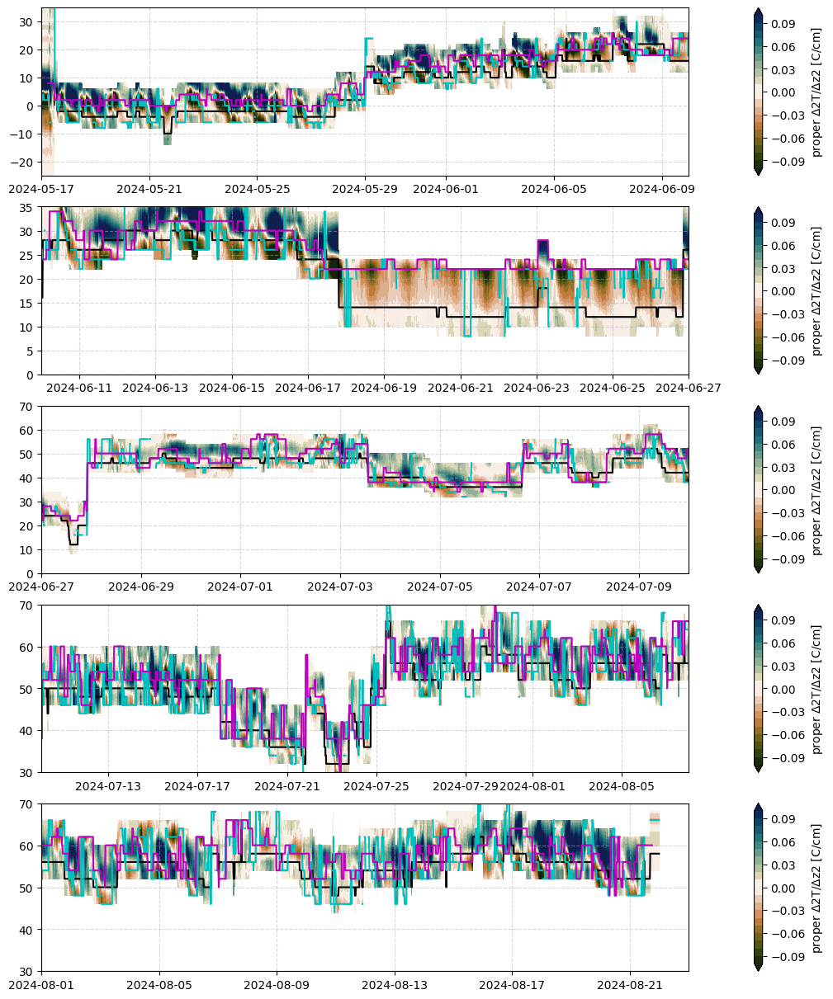

In [451]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(d2Tdz2_masked_outside,0,1),
                    cmap=cmocean.cm.tarn, levels=np.arange(-.1,.11,.01), extend='both')
    plt.colorbar(cb, label='proper $\Delta$2T/$\Delta$z2 [C/cm]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates, limited_sfc_var, c='m')
    # ax.plot(simba_dates, sfc_second_var, c='limegreen')


    # ax.plot(simba_dates, lower_sfc_lim, c='m')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

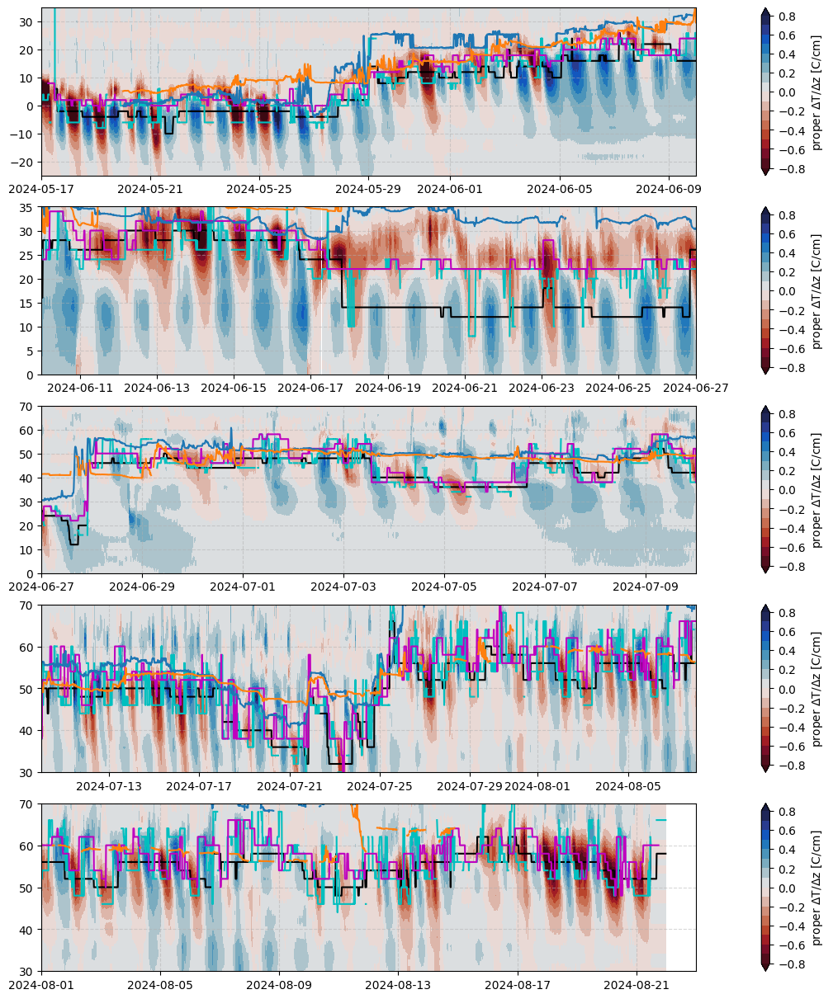

In [452]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance_r, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates, limited_sfc_var, c='m')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')

plt.show()

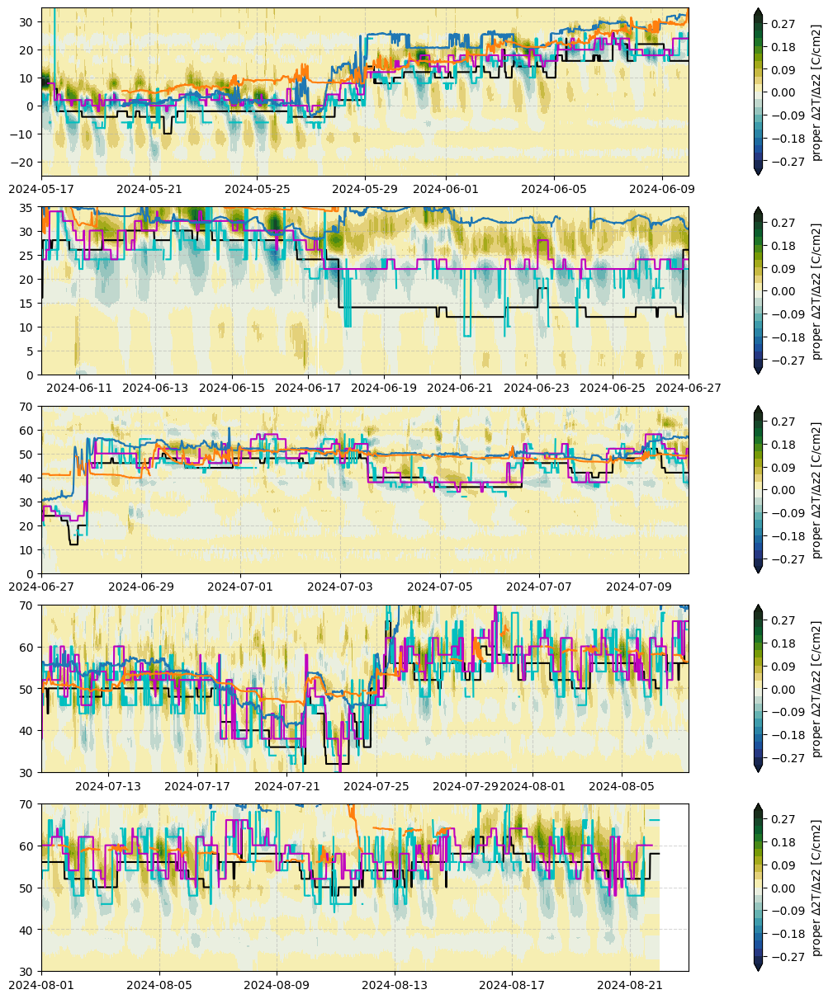

In [453]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1),
                    cmap=cmocean.cm.delta, levels=np.arange(-.3,.31,.03), extend='both')
    plt.colorbar(cb, label='proper $\Delta$2T/$\Delta$z2 [C/cm2]', ax=ax)

    
    ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates, limited_sfc_var, c='m')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')

plt.show()

## try 'postprocessing' ie smoothing, despiking, rounding...

In [454]:
def despike(dataseries, window_size, threshold, mode='same', fill_with_mean=False):
    # window_size = 24*4+1
    weights = np.ones(window_size) / window_size
    running_mean = np.convolve(dataseries, weights, mode=mode)
    running_std = pd.Series(dataseries).rolling(window_size).std(ddof=0).values[window_size-1:]

    if mode=='valid':
        short_dataseries = dataseries[int(window_size/2):-int(window_size/2)]
        despiked_dataseries = np.where(np.abs(short_dataseries - running_mean)>=(threshold*running_std), np.nan, short_dataseries)
    despiked_dataseries = np.ma.masked_invalid(despiked_dataseries)
    
    if fill_with_mean:
        despiked_dataseries = np.where(despiked_dataseries==np.nan, running_mean, despiked_dataseries)

    # plt.plot(simba_dates, dataseries)
    # plt.plot(simba_dates[int(win/2):-int(win/2)], running_mean)

    # plt.plot(simba_dates[int(win/2):-int(win/2)], despiked_dataseries)
    # # plt.plot(simba_dates[int(win/2):-int(win/2)], despiked_limited_sfc_var_fill, ls='--')
    # # plt.ylim(-10,25)
    # # plt.xlim((datetime(2024,5,17), datetime(2024,6,10)))
    # plt.show()

    return despiked_dataseries, running_mean

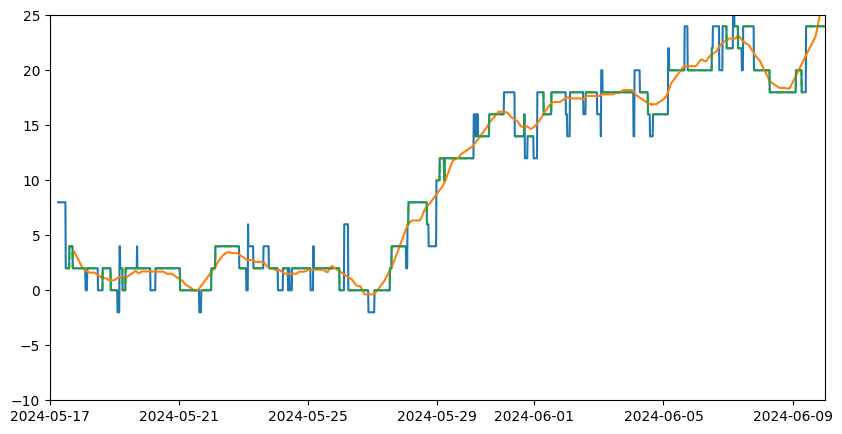

In [469]:
fig, ax = plt.subplots(1, figsize=(10,5))

win = 4*24+1
despiked_limited_sfc_var, smoothed_limited_sfc_var = despike(limited_sfc_var, win, 1, mode='valid')
despiked_limited_sfc, smoothed_limited_sfc = despike(limited_sfc, win, .5, mode='valid')

# despiked_limited_sfc_var_fill = despike(limited_sfc_var, win, .75, mode='valid', fill_with_mean=True)
plt.plot(simba_dates, limited_sfc_var)

plt.plot(simba_dates[int(win/2):-int(win/2)], smoothed_limited_sfc_var)
plt.plot(simba_dates[int(win/2):-int(win/2)], despiked_limited_sfc_var, ls='--')
plt.ylim(-10,25)
plt.xlim((datetime(2024,5,17), datetime(2024,6,10)))
plt.show()

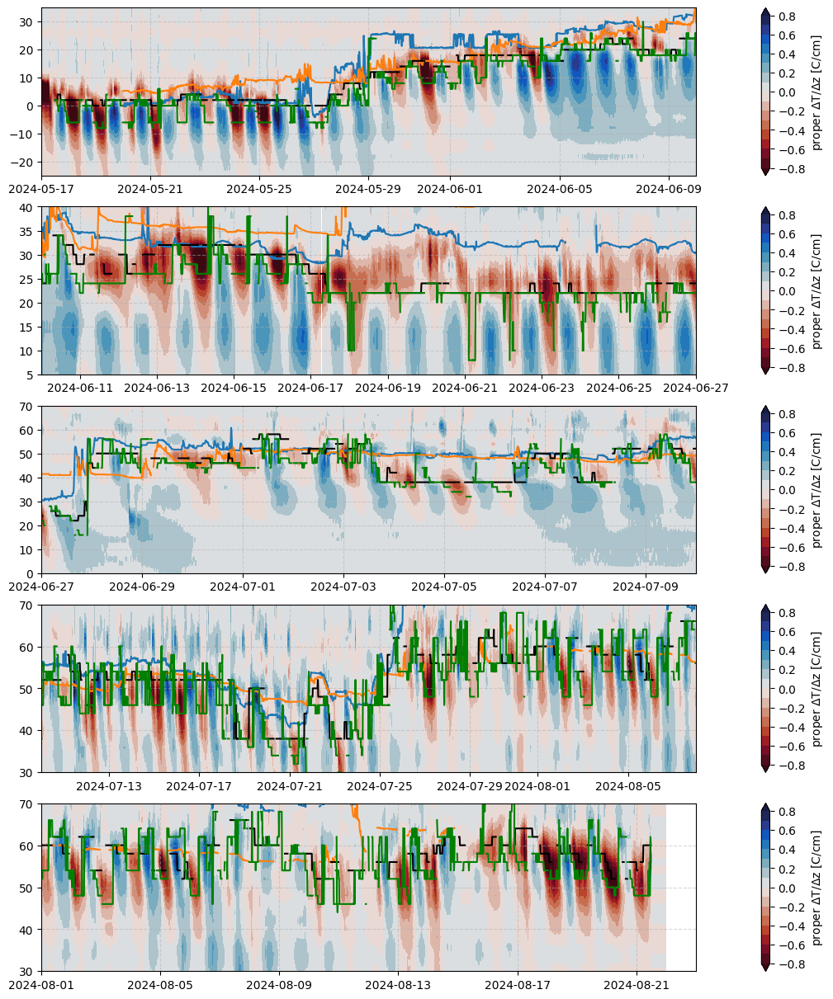

In [470]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(5,40),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance_r, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')    
    # ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    # ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates[int(win/2):-int(win/2)], despiked_limited_sfc_var, c='k')
    ax.plot(simba_dates[int(win/2):-int(win/2)], despiked_limited_sfc, c='g')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')


plt.show()

In [471]:
simba_seconds = np.asarray([(t-datetime(1970,1,1)).total_seconds() for t in simba_dates])

In [472]:


f_sfc = interpolate.interp1d(simba_seconds[int(win/2):-int(win/2)][~despiked_limited_sfc_var.mask], 
                             despiked_limited_sfc_var[~despiked_limited_sfc_var.mask], 
                             fill_value=(despiked_limited_sfc_var[0], despiked_limited_sfc_var[-1]), bounds_error=False)
filled_sfc = f_sfc(simba_seconds)
# filled_sfc = np.ma.masked_equal(filled_sfc, -999)


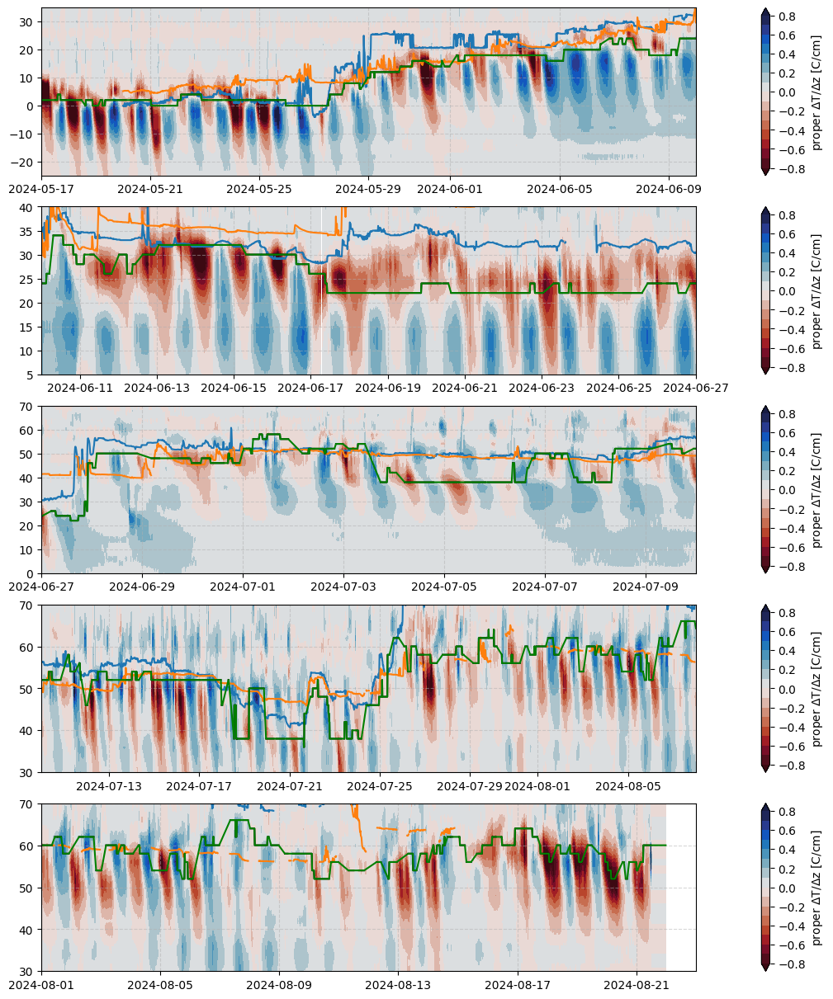

In [473]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(5,40),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance_r, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')    
    # ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    # ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates[int(win/2):-int(win/2)], despiked_limited_sfc_var, c='k')
    ax.plot(simba_dates, filled_sfc, c='g')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')


plt.show()

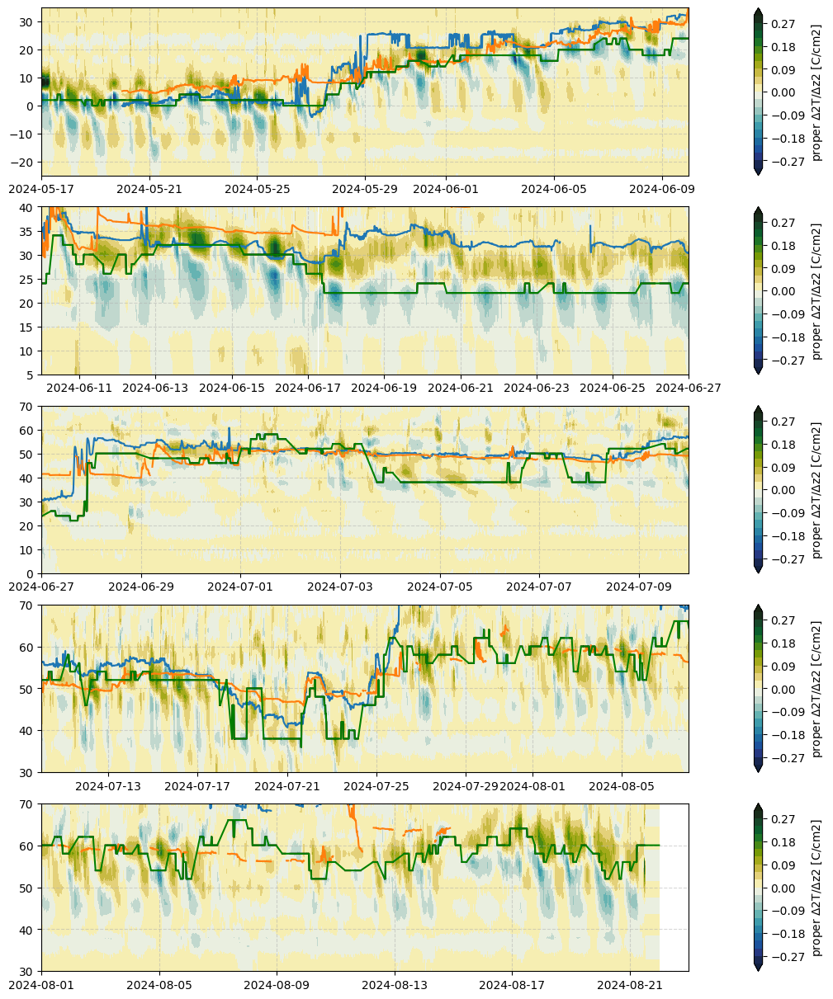

In [474]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(5,40),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(second_vert_grad,0,1),
                    cmap=cmocean.cm.delta, levels=np.arange(-.3,.301,.03), extend='both')
    plt.colorbar(cb, label='proper $\Delta$2T/$\Delta$z2 [C/cm2]', ax=ax)

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')    
    # ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    # ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates[int(win/2):-int(win/2)], despiked_limited_sfc_var, c='k')
    ax.plot(simba_dates, filled_sfc, c='g')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')


plt.show()

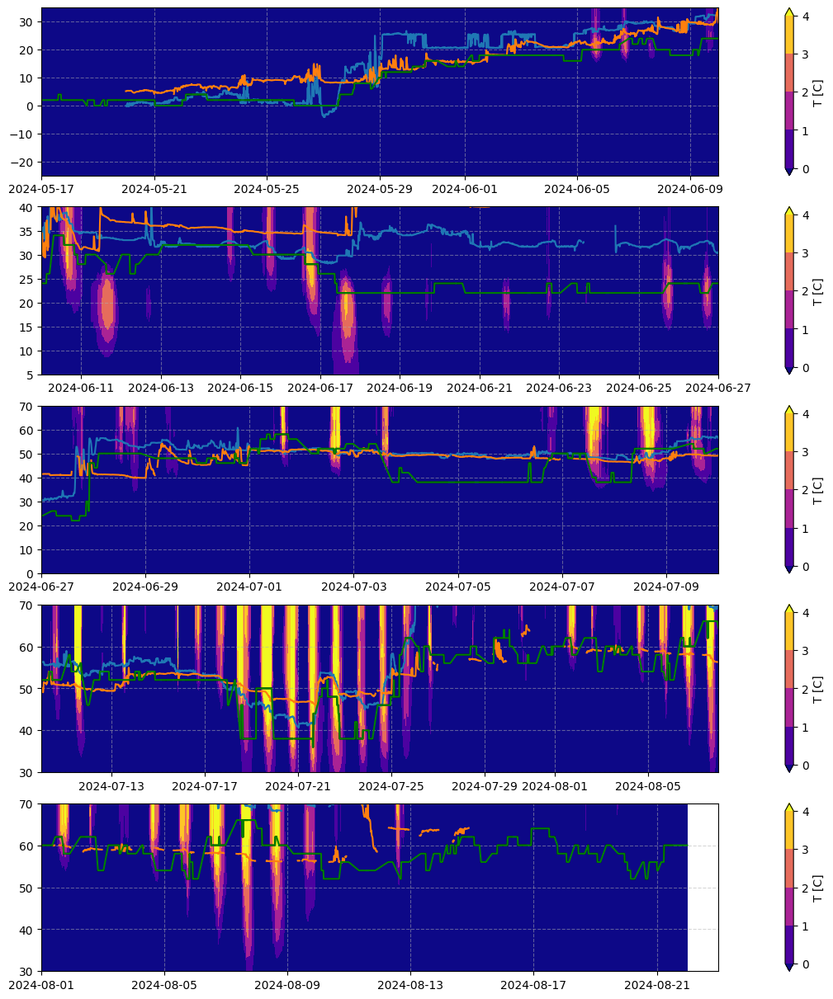

In [475]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(5,40),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(simba_temps,0,1),
                    cmap=plt.cm.plasma, levels=np.arange(0,5,1), extend='both')
    plt.colorbar(cb, label='T [C]', ax=ax)

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')    
    # ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    # ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates[int(win/2):-int(win/2)], despiked_limited_sfc_var, c='k')
    ax.plot(simba_dates, filled_sfc, c='g')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')


plt.show()

## repeat with smoothed temperatures?

In [476]:
window_size = 3
kernel = np.ones(window_size) / window_size

smoothed_temp = np.apply_along_axis(lambda x: np.convolve(x, kernel, mode='same'), axis=1, arr=simba_temps)
smoothed_vert_grad = np.gradient(smoothed_temp, simba_heights,  axis=1)
smoothed_second_vert_grad = np.gradient(smoothed_vert_grad, simba_heights, axis=1)

In [477]:
## calculate dT/dz variances with different window sizes
smoothed_variances_center = {}

# windows = [4, 4*2, 4*4, 4*6, 4*10, 4*12, 4*18, 4*24, 4*48]
windows = 4*np.arange(4,25,4)

# for var, label in zip([vert_grad, second_vert_grad,simba_temps,time_grad,second_time_grad,dTdtdz],['dTdz','d2Tdz2','T','dTdt','d2Tdt2','dTdtdz']):
for var, label in zip([smoothed_vert_grad, smoothed_second_vert_grad,],['dTdz','d2Tdz2',]):

    smoothed_variances_center[label] = {}
    print(label)
    for window in windows:
        print(window)
        
        for i in range(var.shape[0]):

            try:
                time_step_var = np.ma.var(np.ma.masked_invalid(var[i-int(window/2):i+int(window/2)+1,:]), axis=0)
            except:
                time_step_var = np.full(var.shape[0], -999)
                print(simba_dates[i], np.shape(time_step_var))
            # print(i, time_step_var.shape)
            if i==0:
                rolling_var_from_vert_win = time_step_var[np.newaxis,:]
            else:
                rolling_var_from_vert_win = np.ma.concatenate((rolling_var_from_vert_win, time_step_var[np.newaxis,:]))
                
        smoothed_variances_center[label][window] = rolling_var_from_vert_win
print(smoothed_variances_center.keys())

dTdz
16
32
48
64
80
96
d2Tdz2
16
32
48
64
80
96
dict_keys(['dTdz', 'd2Tdz2'])


In [480]:
smoothed_scaled_variances_center = {}
for varname in smoothed_variances_center:
    print(varname)
    smoothed_scaled_variances_center[varname] = {}
    for win in smoothed_variances_center[varname]:
    
        # if win in []
        data = np.copy(smoothed_variances_center[varname][win])
        data[np.where(simba_heights_2d>100)] = 0.
        data[np.where(simba_heights_2d<-50)] = 0.

        smoothed_scaled_variances_center[varname][win] = preprocessing.normalize(data, axis=1)

dTdz
d2Tdz2


In [760]:
smoothed_max_var_sfcs = {}

## mask out increased variances from percolation event that caused water below the surface


for win in [12*4, 24*4]:
    masked_dTdz_var = np.copy(smoothed_scaled_variances_center['dTdz'][win])# np.ma.masked_array(scaled_variances_center['dTdz'][24*4], mask=masked_dTdz.mask)


    masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,6,10))&(simba_dates_2d<datetime(2024,6,13))&(simba_heights_2d<10), 0, masked_dTdz_var)

    masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,6,19))&(simba_dates_2d<datetime(2024,6,21))&(simba_heights_2d>25), 0, masked_dTdz_var)
    masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,7,19))&(simba_dates_2d<datetime(2024,7,21))&(simba_heights_2d>45), 0, masked_dTdz_var)
    masked_dTdz_var = np.where((simba_dates_2d>=datetime(2024,6,6))&(simba_dates_2d<datetime(2024,6,14))&(simba_heights_2d>20), 0, masked_dTdz_var)


    win_sfc = []
    for i in range(masked_dTdz_var.shape[0]):
        timestep_var = masked_dTdz_var[i,:]
        max_height = simba_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]
    
        if len(max_height)!=1:
            win_sfc.append(np.nan)
        else:
            win_sfc.append(max_height[0])
    
    smoothed_max_var_sfcs[win] = np.array(win_sfc)

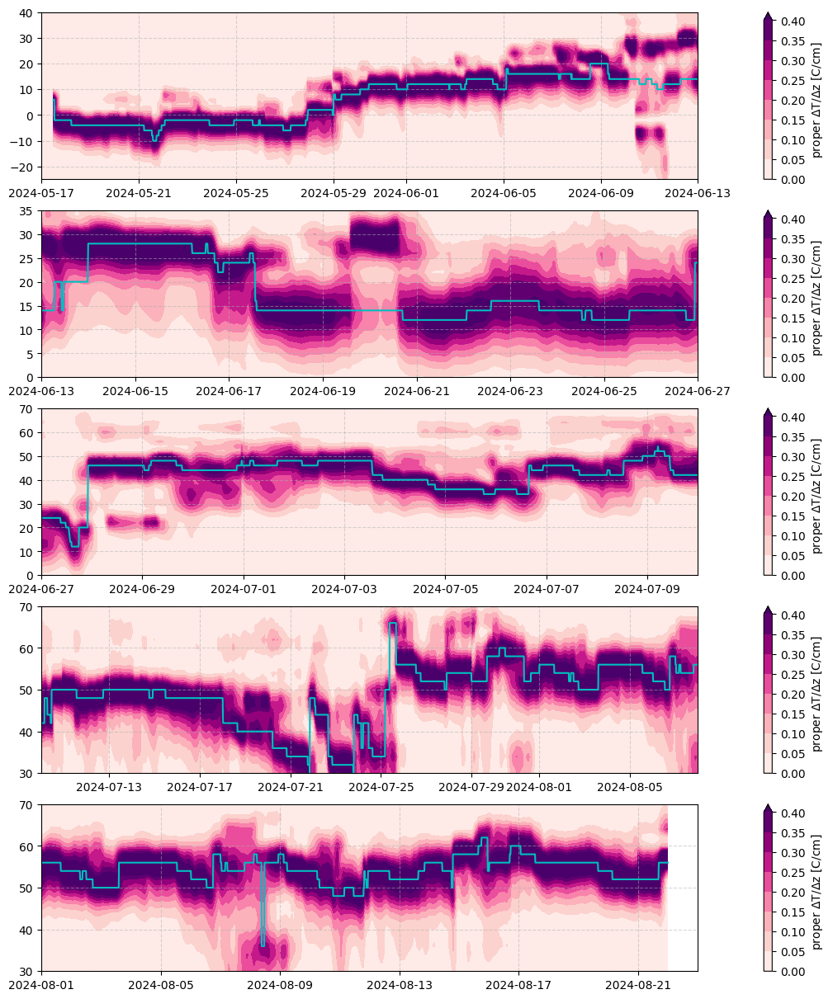

In [761]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,40),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,13)), (datetime(2024,6,13),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(smoothed_scaled_variances_center['dTdz'][24*4],0,1),
                    cmap=plt.cm.RdPu, levels=np.arange(0,.41,.05), extend='max')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, smoothed_max_var_sfcs[24*4], c='c')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')
    
plt.show()

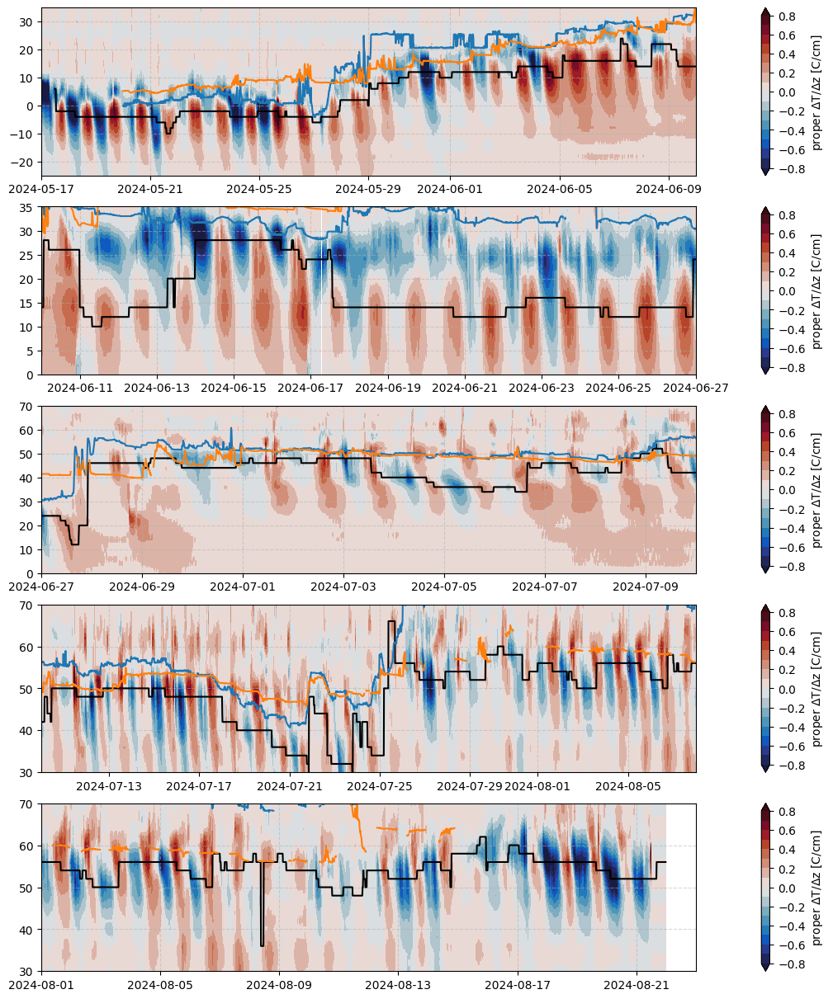

In [516]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    
    ax.plot(simba_dates, smoothed_max_var_sfcs[24*4], c='k')
    # ax.plot(simba_dates, max_var_sfcs[12*4], c='w')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')
    
plt.show()

In [517]:
win = 4*24+1
despiked_smoothed_var, _ = despike(smoothed_max_var_sfcs[24*4], win, .75, mode='valid')


In [518]:
f_sfc = interpolate.interp1d(simba_seconds[int(win/2):-int(win/2)][~despiked_smoothed_var.mask], 
                             despiked_smoothed_var[~despiked_smoothed_var.mask], 
                             fill_value=(despiked_smoothed_var[0], despiked_smoothed_var[-1]), bounds_error=False)
smoothed_filled_sfc = f_sfc(simba_seconds)

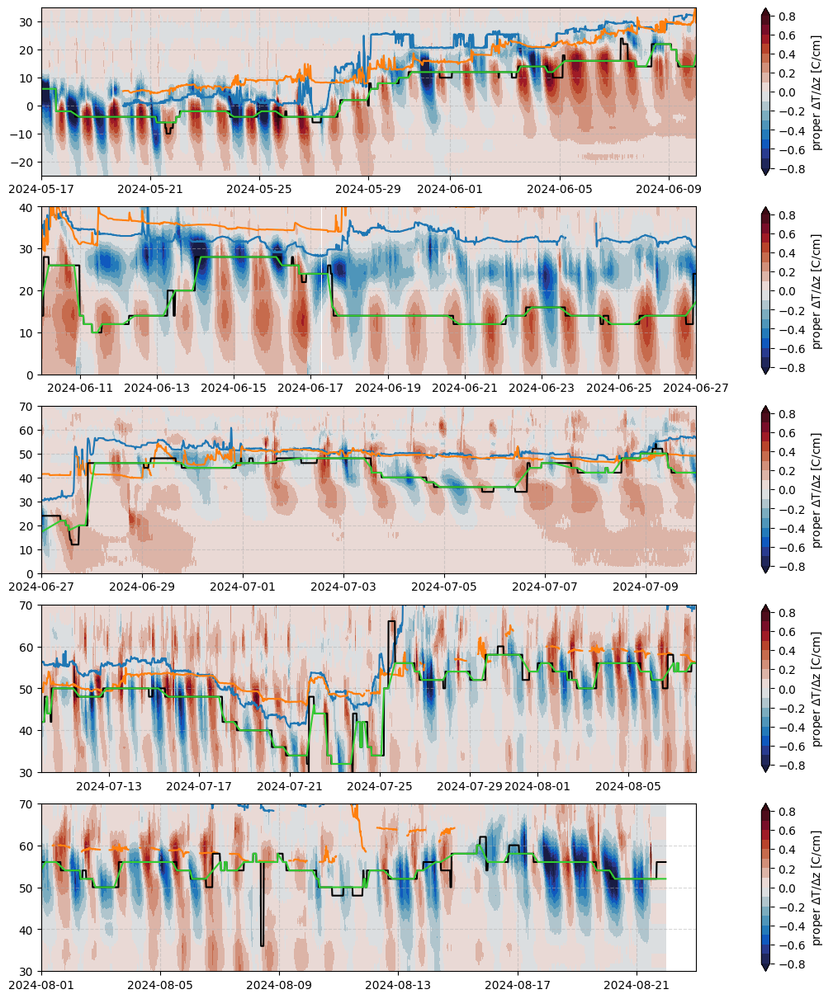

In [519]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,40),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')

    ax.plot(simba_dates, smoothed_max_var_sfcs[24*4], c='k')

    ax.plot(simba_dates, smoothed_filled_sfc, c='limegreen')
    # ax.plot(simba_dates, max_var_sfcs[12*4], c='w')

plt.show()

Need to use this surface as window...

In [520]:
smoothed_upper_sfc_lim = np.copy(smoothed_filled_sfc)+10.
smoothed_lower_sfc_lim = np.copy(smoothed_filled_sfc)-5.

smoothed_lower_2d = np.repeat(smoothed_lower_sfc_lim[:,np.newaxis],simba_heights.shape,axis=1)
smoothed_upper_2d = np.repeat(smoothed_upper_sfc_lim[:,np.newaxis],simba_heights.shape,axis=1)

In [521]:

smoothed_d2Tdz2_var_masked_outside = np.ma.masked_where( simba_heights_2d>upper_2d, np.copy(smoothed_scaled_variances_center['d2Tdz2'][24*4]))
smoothed_d2Tdz2_var_masked_outside = np.ma.masked_where( simba_heights_2d<lower_2d, smoothed_d2Tdz2_var_masked_outside)
smoothed_limited_sfc_var = []

# masked_dTdz_var =scaled_variances_center['dTdz'][24*4]# np.ma.masked_array(scaled_variances_center['dTdz'][24*4], mask=masked_dTdz.mask)

for i in range(smoothed_d2Tdz2_var_masked_outside.shape[0]):
    timestep_var = smoothed_d2Tdz2_var_masked_outside[i,:]
    max_height = simba_heights[np.ma.where(timestep_var==np.ma.max(timestep_var))[0]]

    if len(max_height)!=1:
        smoothed_limited_sfc_var.append(np.nan)
    else:
        smoothed_limited_sfc_var.append(max_height[0])

smoothed_limited_sfc_var = np.array(smoothed_limited_sfc_var)

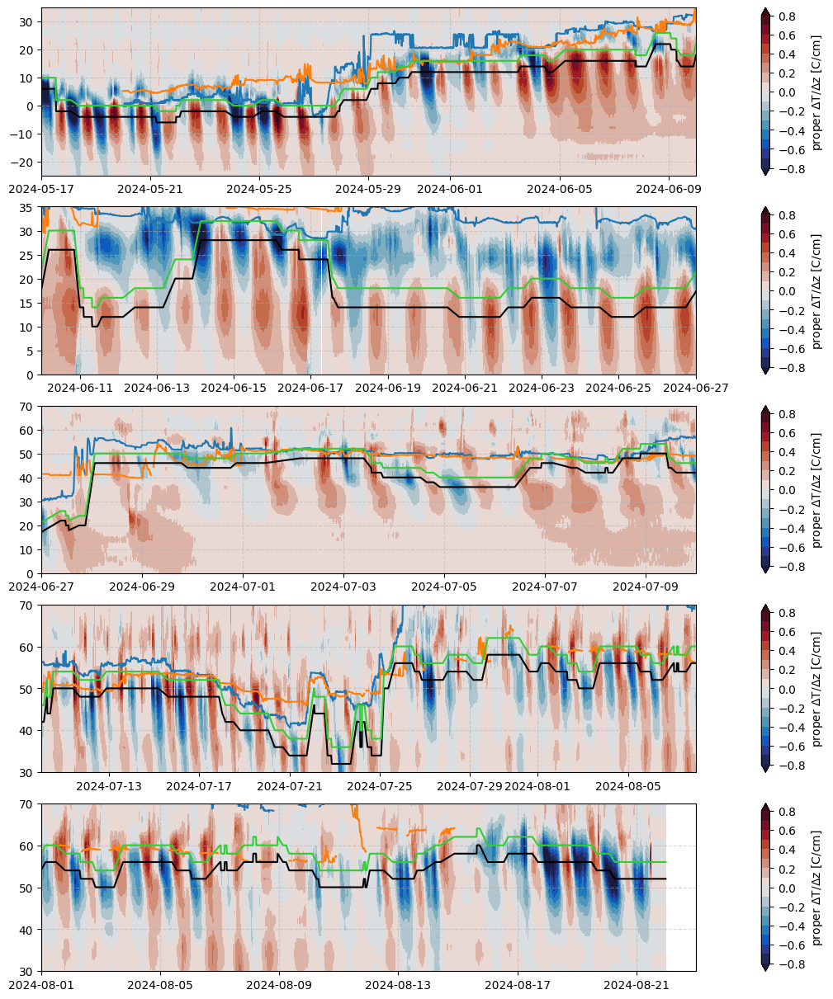

In [522]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(0,35),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(vert_grad,0,1),
                    cmap=cmocean.cm.balance, levels=np.arange(-.8,.81,.1), extend='both')
    plt.colorbar(cb, label='proper $\Delta$T/$\Delta$z [C/cm]', ax=ax)

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')

    ax.plot(simba_dates, smoothed_filled_sfc, c='k')

    ax.plot(simba_dates, smoothed_filled_sfc+4., c='limegreen')
    # ax.plot(simba_dates, max_var_sfcs[12*4], c='w')

plt.show()

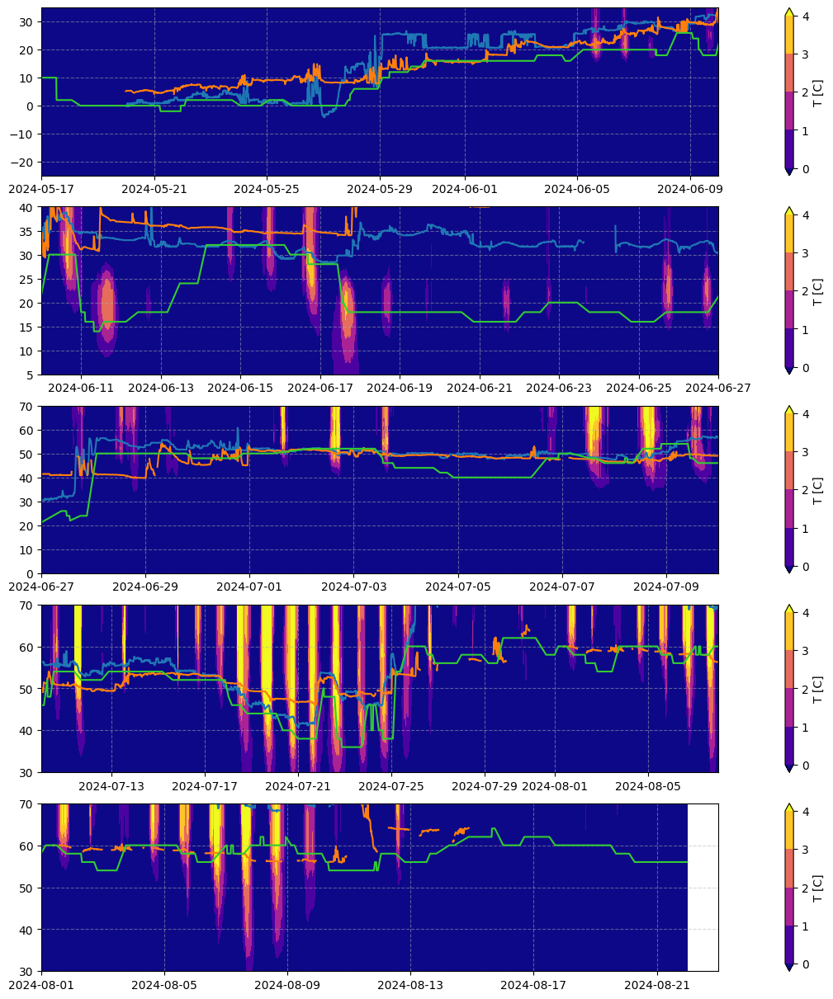

In [523]:
fig, axs = plt.subplots(5, figsize=(10,12),  constrained_layout=True)

ylims = [(-25,35),(5,40),(0,70),(30,70),(30,70)]
xlims = [(datetime(2024,5,17), datetime(2024,6,10)), (datetime(2024,6,10),datetime(2024,6,27)),
         (datetime(2024,6,27),datetime(2024,7,10)),(datetime(2024,7,10),datetime(2024,8,8)),
         (datetime(2024,8,1),datetime(2024,8,23))]
for i, ax in enumerate(axs.ravel()):
    cb = ax.contourf(simba_dates, simba_heights, np.swapaxes(simba_temps,0,1),
                    cmap=plt.cm.plasma, levels=np.arange(0,5,1), extend='both')
    plt.colorbar(cb, label='T [C]', ax=ax)

    ax.plot( asfs_data_lev2['dates'], (asfs_data_lev2['snow_gpr_dist'][0]-asfs_data_lev2['snow_gpr_dist'])*100., label='GPR laser')
    ax.plot( asfs_data_lev2['dates'], asfs_data_lev2['snow_depth'], label='SLEIGH pinger')    
    # ax.plot(simba_dates, max_var_sfcs[24*4], c='k')
    # ax.plot(simba_dates, limited_sfc, c='c')
    ax.plot(simba_dates, smoothed_filled_sfc+4., c='limegreen')
    # ax.plot(simba_dates, filled_sfc, c='g')

    ax.set_ylim(ylims[i])
    ax.set_xlim(xlims[i])
    ax.grid(alpha=.5, ls='--')


plt.show()

## Save and test with solar correction

In [524]:
pd.Series(smoothed_filled_sfc+4.).to_csv('Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_+4cm_v2_20250710.csv')


ValueError: x and y must have same first dimension, but have shapes (9312,) and (2813,)

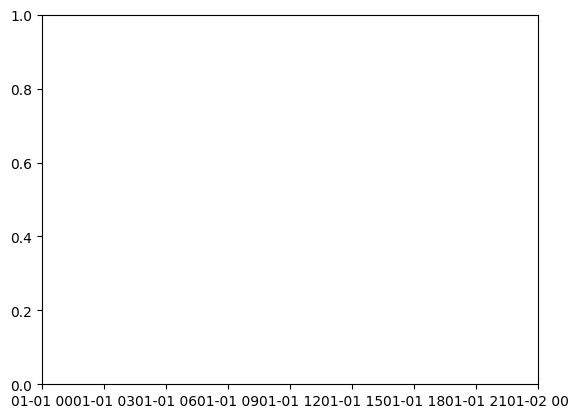

In [799]:
plt.plot(simba_dates, sfc_median_day_d2Tdz2)
plt.plot(simba_dates, dTdz_threshold_sfc)
plt.show()

In [805]:
# data_to_write = zip(simba_dates, smoothed_filled_sfc+4.)
# filename = "Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_+4cm_v2_20250710.csv"
# filename = 'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_first-0.2-var-above-max_v2_20250723.csv' #dTdz_threshold_sfc
# filename = 'Raven2024_SIMBA_sfc_id_min-scaled-d2Tdz2_median-daytime-bin_5T-mask_v2.1_20250723.csv' #sfc_median_day_d2Tdz2
filename = 'Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_v2_20250723.csv' # max_var_sfcs['dTdz'][24*4]


data_to_write = zip(simba_dates, max_var_sfcs['dTdz'][24*4])
# filename = "Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_first-0.2-var-above-max_v2_20250722.csv"
# filename = "Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_first-0.2-var-above-max_combined-with-centered-smoothed-24hrolling-dTdz-variance_+4cm_20250722.csv"

header = ["datetime", "surface [cm]"]

with open(filename, 'w', newline='') as csvfile:
    writer = csv.writer(csvfile)
    writer.writerow(header)  # Write the header row
    writer.writerows(data_to_write) # Write all data rows

print(f"Data with timestamps successfully written to {filename}")

Data with timestamps successfully written to Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_v2_20250723.csv


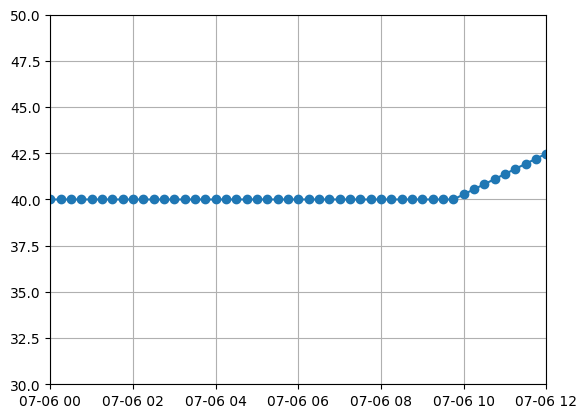

In [537]:
plt.plot(simba_dates, smoothed_filled_sfc+4., marker='o')
plt.xlim(datetime(2024,7,6),datetime(2024,7,6,12))
plt.ylim(30,50)
plt.grid()
plt.show()

In [543]:
## mannually adjust a few spots based on temp corrections
mann_adjusted_sfc = smoothed_filled_sfc+4.
mann_adjusted_sfc = np.where((simba_dates>=datetime(2024,7,4,16))&(simba_dates<datetime(2024,7,6,12)), 42, mann_adjusted_sfc)

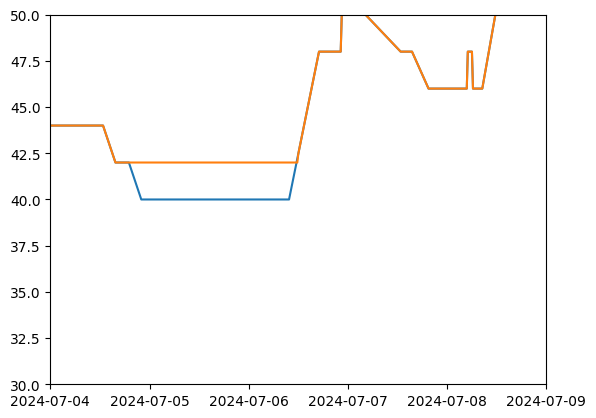

In [544]:
plt.plot(simba_dates, smoothed_filled_sfc+4.)
plt.plot(simba_dates, mann_adjusted_sfc)
plt.xlim(datetime(2024,7,4),datetime(2024,7,9))
plt.ylim(30,50)
plt.show()

In [545]:
pd.Series(mann_adjusted_sfc).to_csv('Raven2024_SIMBA_sfc_id_centered-smoothed-24hrolling-dTdz-variance_+4cm-mannually-adjusted_v2_20250711.csv')
